# Clustering


### Import libraries

In [100]:
import csv
import numpy as np
import pandas as pd
import seaborn as sns
import tkinter as tk
from kneed import KneeLocator
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.datasets import make_moons
from sklearn.exceptions import ConvergenceWarning
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score, adjusted_rand_score
from sklearn.preprocessing import StandardScaler
from sklearn.utils._testing import ignore_warnings
from tkinter import messagebox
from yellowbrick.cluster import SilhouetteVisualizer
import plotly.express as px
import plotly.graph_objs as go
import scipy.cluster.hierarchy as sch

### Read data from interview - csv

In [2]:
InterviewData=pd.read_csv("responses.csv")

### Making all columns visible and showing first five rows

In [3]:
pd.set_option('display.max_columns', 999)
InterviewData.head()


,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Punctuality,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Internet usage,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,1.0,5.0,4.0,2.0,5.0,4.0,4.0,1.0,5.0,5.0,3.0,1.0,2.0,1.0,5.0,1.0,3.0,3.0,5.0,3.0,5.0,3.0,3.0,3.0,3.0,5.0,3.0,1.0,1.0,1.0,1.0,5.0,3.0,3.0,2.0,1.0,5.0,5.0,1.0,4.0,4.0,2.0,5.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,5,3.0,1.0,3.0,2.0,never smoked,drink a lot,4.0,2.0,2.0,5.0,4.0,2.0,5.0,4.0,4.0,1.0,3.0,5.0,1.0,1.0,3.0,4.0,1.0,3.0,1.0,3.0,1,4.0,5.0,4.0,3.0,2.0,1.0,1.0,1.0,4,2.0,3,i am always on time,never,3.0,4.0,3.0,4.0,3.0,4.0,3.0,5.0,1.0,1.0,3.0,5.0,5.0,1.0,4.0,5.0,1.0,4.0,3.0,2.0,3.0,4.0,3.0,few hours a day,3.0,4.0,5.0,3.0,3.0,1,3.0,20.0,163.0,48.0,1.0,female,right handed,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,4.0,1.0,3.0,1.0,4.0,4.0,2.0,1.0,1.0,5.0,2.0,2.0,4.0,3.0,4.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3.0,4.0,5.0,2.0,4.0,4.0,5.0,1.0,1.0,4.0,4.0,5.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,3.0,2.0,4.0,2.0,5.0,1.0,1.0,1.0,2.0,1.0,1,1.0,3.0,1.0,4.0,never smoked,drink a lot,3.0,3.0,2.0,4.0,5.0,4.0,1.0,4.0,4.0,3.0,4.0,3.0,2.0,1.0,2.0,5.0,4.0,4.0,1.0,2.0,1,2.0,4.0,3.0,2.0,4.0,4.0,4.0,1.0,3,1.0,3,i am often early,sometimes,3.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,2.0,5.0,4.0,4.0,4.0,1.0,4.0,3.0,5.0,3.0,4.0,5.0,3.0,2.0,3.0,few hours a day,3.0,4.0,1.0,4.0,2.0,5,2.0,19.0,163.0,58.0,2.0,female,right handed,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,4.0,1.0,4.0,3.0,5.0,5.0,5.0,1.0,3.0,5.0,3.0,4.0,4.0,2.0,4.0,2.0,5.0,5.0,2.0,2.0,1.0,1.0,2.0,1.0,5.0,2.0,4.0,2.0,4.0,1.0,1.0,5.0,2.0,5.0,2.0,3.0,1.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,2.0,1.0,1.0,4.0,2.0,5.0,5.0,5.0,5.0,1.0,1.0,1.0,1.0,1.0,1,1.0,1.0,1.0,2.0,tried smoking,drink a lot,3.0,1.0,2.0,5.0,3.0,5.0,3.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,3.0,5.0,4.0,4.0,1.0,5.0,5,5.0,4.0,2.0,5.0,3.0,2.0,5.0,5.0,1,3.0,3,i am often running late,sometimes,2.0,3.0,4.0,3.0,5.0,3.0,4.0,4.0,3.0,4.0,3.0,2.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,5.0,3.0,1.0,few hours a day,2.0,4.0,1.0,4.0,3.0,4,2.0,20.0,176.0,67.0,2.0,female,right handed,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,4.0,2.0

### Filter subset of columns, choosing the most interesting columns

In [4]:
FilteredInterviewData = InterviewData[['Music','Slow songs or fast songs','Movies','History','Psychology','Mathematics',
'Science and technology', 'Reading', 'Foreign languages', 'Religion', 'Passive sport', 'Active sport', 'War', 'Health', 'Healthy eating',
 'Fun with friends', 'Smoking', 'Alcohol', 'Writing notes' , 'Thinking ahead', 'Keeping promises', 'Internet', 'Physics', 'Politics', 'Gender', 'Children',
 'Loss of interest',  'Friends versus money', 'Funniness', 'Fake', 'Empathy', 'Compassion to animals', 'Shopping', 'Cars', 'Shopping centres',
  'God', 'Number of friends', 'Lying', 'Achievements', 'Happiness in life', 'Interests or hobbies', 
  'Finances', 'Age', 'Number of siblings', 'Education', 'Village - town', ]].copy()
myColumns = FilteredInterviewData.columns
FilteredInterviewData.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1010 entries, 0 to 1009
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Music                     1007 non-null   float64
 1   Slow songs or fast songs  1008 non-null   float64
 2   Movies                    1004 non-null   float64
 3   History                   1008 non-null   float64
 4   Psychology                1005 non-null   float64
 5   Mathematics               1007 non-null   float64
 6   Science and technology    1004 non-null   float64
 7   Reading                   1004 non-null   float64
 8   Foreign languages         1005 non-null   float64
 9   Religion                  1007 non-null   float64
 10  Passive sport             995 non-null    float64
 11  Active sport              1006 non-null   float64
 12  War                       1008 non-null   float64
 13  Health                    1009 non-null   float64
 14  Healthy 

### Data types - missing values

#### Review of data types

In [5]:
FilteredInterviewData.dtypes

Music                       float64
Slow songs or fast songs    float64
Movies                      float64
History                     float64
Psychology                  float64
Mathematics                 float64
Science and technology      float64
Reading                     float64
Foreign languages           float64
Religion                    float64
Passive sport               float64
Active sport                float64
War                         float64
Health                      float64
Healthy eating              float64
Fun with friends            float64
Smoking                      object
Alcohol                      object
Writing notes               float64
Thinking ahead              float64
Keeping promises            float64
Internet                    float64
Physics                     float64
Politics                    float64
Gender                       object
Children                    float64
Loss of interest            float64
Friends versus money        

#### Review of columns with missing data

In [6]:
FilteredInterviewData.isna().sum()

Music                        3
Slow songs or fast songs     2
Movies                       6
History                      2
Psychology                   5
Mathematics                  3
Science and technology       6
Reading                      6
Foreign languages            5
Religion                     3
Passive sport               15
Active sport                 4
War                          2
Health                       1
Healthy eating               3
Fun with friends             4
Smoking                      8
Alcohol                      5
Writing notes                3
Thinking ahead               3
Keeping promises             1
Internet                     4
Physics                      3
Politics                     1
Gender                       6
Children                     4
Loss of interest             4
Friends versus money         6
Funniness                    4
Fake                         1
Empathy                      5
Compassion to animals        7
Shopping

#### Showing nulls

<AxesSubplot: >

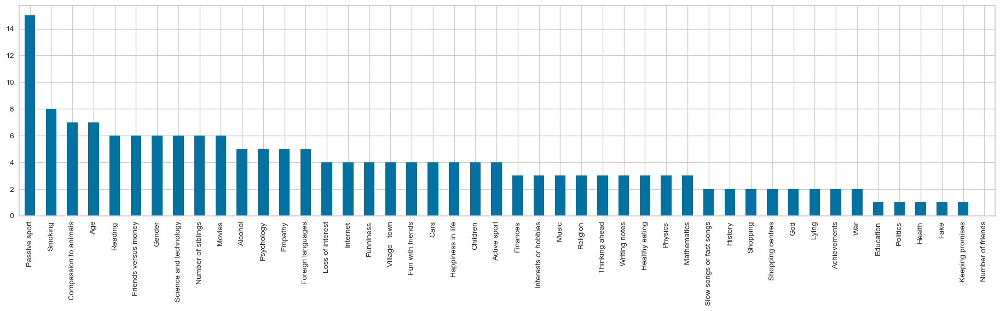

In [7]:
nulls = FilteredInterviewData.isnull().sum().sort_values(ascending=False)
nulls.plot(kind='bar', figsize=(23, 5))

#### Counting missing data columns - result: all

In [8]:
columnsList = FilteredInterviewData.columns[FilteredInterviewData.isna().any()].tolist()
print(columnsList)
print("Number of columns with missing values: ", len(columnsList))

['Music', 'Slow songs or fast songs', 'Movies', 'History', 'Psychology', 'Mathematics', 'Science and technology', 'Reading', 'Foreign languages', 'Religion', 'Passive sport', 'Active sport', 'War', 'Health', 'Healthy eating', 'Fun with friends', 'Smoking', 'Alcohol', 'Writing notes', 'Thinking ahead', 'Keeping promises', 'Internet', 'Physics', 'Politics', 'Gender', 'Children', 'Loss of interest', 'Friends versus money', 'Funniness', 'Fake', 'Empathy', 'Compassion to animals', 'Shopping', 'Cars', 'Shopping centres', 'God', 'Lying', 'Achievements', 'Happiness in life', 'Interests or hobbies', 'Finances', 'Age', 'Number of siblings', 'Education', 'Village - town']
Number of columns with missing values:  45


### Preparing of categorical data to be replaced w numerical

In [9]:
objectColumns = list(FilteredInterviewData.select_dtypes(['object']).columns)
for column in objectColumns:
    print(column +": "+ str(FilteredInterviewData[column].unique()))


Smoking: ['never smoked' 'tried smoking' 'former smoker' 'current smoker' nan]
Alcohol: ['drink a lot' 'social drinker' 'never' nan]
Gender: ['female' 'male' nan]
Lying: ['never' 'sometimes' 'only to avoid hurting someone'
 'everytime it suits me' nan]
Education: ['college/bachelor degree' 'secondary school' 'primary school'
 'masters degree' 'doctorate degree' 'currently a primary school pupil'
 nan]
Village - town: ['village' 'city' nan]


### Replacing categorical data with numerical

In [10]:
FilteredInterviewData.replace(['never', 'social drinker', 'drink a lot'], [1, 3, 5], inplace=True)
FilteredInterviewData.replace(['never smoked', 'tried smoking', 'current smoker', 'former smoker'], [0, 3, 4, 5], inplace=True)
FilteredInterviewData.replace(['female', 'male'], [5, 0], inplace=True)
FilteredInterviewData.replace(['never', 'sometimes', 'only to avoid hurting someone', 'everytime it suits me'], [0, 3, 4, 5], inplace=True)
FilteredInterviewData.replace(['currently a primary school pupil', 'primary school', 'secondary school', 'college/bachelor degree', 'masters degree', 'doctorate degree'], [0, 1, 2, 3, 4, 5], inplace=True)
FilteredInterviewData.replace(['village', 'city'], [5, 0],inplace=True)

InterviewData.replace(['never', 'social drinker', 'drink a lot'], [1, 3, 5], inplace=True)
InterviewData.replace(['never smoked', 'tried smoking', 'current smoker', 'former smoker'], [0, 3, 4, 5], inplace=True)
InterviewData.replace(['female', 'male'], [5, 0], inplace=True)
InterviewData.replace(['never', 'sometimes', 'only to avoid hurting someone', 'everytime it suits me'], [0, 3, 4, 5], inplace=True)
InterviewData.replace(['currently a primary school pupil', 'primary school', 'secondary school', 'college/bachelor degree', 'masters degree', 'doctorate degree'], [0, 1, 2, 3, 4, 5], inplace=True)
InterviewData.replace(['village', 'city'], [5, 0], inplace=True)



In [11]:
FilteredInterviewData.head()


,Music,Slow songs or fast songs,Movies,History,Psychology,Mathematics,Science and technology,Reading,Foreign languages,Religion,Passive sport,Active sport,War,Health,Healthy eating,Fun with friends,Smoking,Alcohol,Writing notes,Thinking ahead,Keeping promises,Internet,Physics,Politics,Gender,Children,Loss of interest,Friends versus money,Funniness,Fake,Empathy,Compassion to animals,Shopping,Cars,Shopping centres,God,Number of friends,Lying,Achievements,Happiness in life,Interests or hobbies,Finances,Age,Number of siblings,Education,Village - town
0,5.0,3.0,5.0,1.0,5.0,3.0,4.0,3.0,5.0,1.0,1.0,5.0,1.0,1.0,4.0,5.0,0.0,5.0,5.0,2.0,4.0,5.0,3.0,1.0,5.0,5.0,1.0,3.0,5.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3,1.0,4.0,4.0,3.0,3.0,20.0,1.0,3.0,5.0
1,4.0,4.0,5.0,1.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,1.0,1.0,4.0,3.0,4.0,0.0,5.0,4.0,4.0,4.0,4.0,2.0,4.0,5.0,2.0,3.0,4.0,3.0,2.0,2.0,4.0,3.0,2.0,4.0,1.0,3,3.0,2.0,4.0,3.0,3.0,19.0,2.0,3.0,0.0
2,5.0,5.0,5.0,1.0,2.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0,2.0,3.0,5.0,3.0,5.0,5.0,5.0,5.0,4.0,2.0,1.0,5.0,4.0,1.0,5.0,2.0,4.0,5.0,4.0,4.0,1.0,4.0,5.0,3,3.0,3.0,4.0,5.0,2.0,20.0,2.0,2.0,0.0
3,5.0,3.0,5.0,4.0,4.0,4.0,3.0,5.0,4.0,4.0,1.0,1.0,3.0,1.0,3.0,2.0,5.0,5.0,4.0,3.0,4.0,3.0,1.0,5.0,5.0,2.0,5.0,2.0,1.0,1.0,3.0,2.0,4.0,1.0,4.0,4.0,1,4.0,3.0,2.0,NaN,2.0,22.0,1.0,3.0,0.0
4,5.0,3.0,5.0,3.0,2.0,2.0,3.0,5.0,3.0,4.0,3.0,1.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,5.0,4.0,2.0,2.0,3.0,5.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,5.0,3,5.0,3.0,3.0,3.0,4.0,20.0,1.0,2.0,5.0


### Fill missing values with median value

In [12]:
FilteredInterviewData.fillna(FilteredInterviewData.median(),inplace=True)
FilteredInterviewData.isna().sum()

Music                       0
Slow songs or fast songs    0
Movies                      0
History                     0
Psychology                  0
Mathematics                 0
Science and technology      0
Reading                     0
Foreign languages           0
Religion                    0
Passive sport               0
Active sport                0
War                         0
Health                      0
Healthy eating              0
Fun with friends            0
Smoking                     0
Alcohol                     0
Writing notes               0
Thinking ahead              0
Keeping promises            0
Internet                    0
Physics                     0
Politics                    0
Gender                      0
Children                    0
Loss of interest            0
Friends versus money        0
Funniness                   0
Fake                        0
Empathy                     0
Compassion to animals       0
Shopping                    0
Cars      

In [13]:

InterviewData.fillna(InterviewData.median(),inplace=True)
InterviewData.isna().sum()

C:\Users\Nikola Petrovic\AppData\Local\Temp\ipykernel_23532\3407892556.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  InterviewData.fillna(InterviewData.median(),inplace=True)


Music                       0
Slow songs or fast songs    0
Dance                       0
Folk                        0
Country                     0
                           ..
Left - right handed         3
Education                   0
Only child                  2
Village - town              0
House - block of flats      4
Length: 150, dtype: int64

#### Removing some data from whole dataset

In [14]:
InterviewData = InterviewData.select_dtypes(exclude=['object'])
InterviewDataWithoutVillageNGender = InterviewData.drop(columns=['Village - town', 'Gender'])

### Showing some rows

In [15]:
InterviewData.head()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Education,Village - town
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,1.0,5.0,4.0,2.0,5.0,4.0,4.0,1.0,5.0,5.0,3.0,1.0,2.0,1.0,5.0,1.0,3.0,3.0,5.0,3.0,5.0,3.0,3.0,3.0,3.0,5.0,3.0,1.0,1.0,1.0,1.0,5.0,3.0,3.0,2.0,1.0,5.0,5.0,1.0,4.0,4.0,2.0,5.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,5,3.0,1.0,3.0,2.0,0.0,5.0,4.0,2.0,2.0,5.0,4.0,2.0,5.0,4.0,4.0,1.0,3.0,5.0,1.0,1.0,3.0,4.0,1.0,3.0,1.0,3.0,1,4.0,5.0,4.0,3.0,2.0,1.0,1.0,1.0,4,2.0,3,1.0,3.0,4.0,3.0,4.0,3.0,4.0,3.0,5.0,1.0,1.0,3.0,5.0,5.0,1.0,4.0,5.0,1.0,4.0,3.0,2.0,3.0,4.0,3.0,3.0,4.0,5.0,3.0,3.0,1,3.0,20.0,163.0,48.0,1.0,5.0,3.0,5.0
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,4.0,1.0,3.0,1.0,4.0,4.0,2.0,1.0,1.0,5.0,2.0,2.0,4.0,3.0,4.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3.0,4.0,5.0,2.0,4.0,4.0,5.0,1.0,1.0,4.0,4.0,5.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,3.0,2.0,4.0,2.0,5.0,1.0,1.0,1.0,2.0,1.0,1,1.0,3.0,1.0,4.0,0.0,5.0,3.0,3.0,2.0,4.0,5.0,4.0,1.0,4.0,4.0,3.0,4.0,3.0,2.0,1.0,2.0,5.0,4.0,4.0,1.0,2.0,1,2.0,4.0,3.0,2.0,4.0,4.0,4.0,1.0,3,1.0,3,3.0,3.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,2.0,5.0,4.0,4.0,4.0,1.0,4.0,3.0,5.0,3.0,4.0,5.0,3.0,2.0,3.0,3.0,4.0,1.0,4.0,2.0,5,2.0,19.0,163.0,58.0,2.0,5.0,3.0,0.0
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,4.0,1.0,4.0,3.0,5.0,5.0,5.0,1.0,3.0,5.0,3.0,4.0,4.0,2.0,4.0,2.0,5.0,5.0,2.0,2.0,1.0,1.0,2.0,1.0,5.0,2.0,4.0,2.0,4.0,1.0,1.0,5.0,2.0,5.0,2.0,3.0,1.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,2.0,1.0,1.0,4.0,2.0,5.0,5.0,5.0,5.0,1.0,1.0,1.0,1.0,1.0,1,1.0,1.0,1.0,2.0,3.0,5.0,3.0,1.0,2.0,5.0,3.0,5.0,3.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,3.0,5.0,4.0,4.0,1.0,5.0,5,5.0,4.0,2.0,5.0,3.0,2.0,5.0,5.0,1,3.0,3,3.0,2.0,3.0,4.0,3.0,5.0,3.0,4.0,4.0,3.0,4.0,3.0,2.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,5.0,3.0,1.0,2.0,4.0,1.0,4.0,3.0,4,2.0,20.0,176.0,67.0,2.0,5.0,2.0,0.0
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,4.0,2.0,2.0,1.0,2.0,5.0,1.0,2.0,1.0,5.0,4.0,4.0,3.0,3.0,4.0,3.0,1.0,2.0,5.0,1.0,2.0,4.0,4.0,5.0,4.0,1.0,3.0,1.0,2.0,3.0,3.0,5.0,4.0,4.0,2.0,5.0,1.0,5.0,4.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,2.0,4.0,3.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,3.0,5.0,5,5.0,4.0,5.0,5.0,5.0,5.0,3.0,4.0,4.0,4.0,5.0,3.0,1.0,3.0,4.0,5.0,2.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,3.0,3.0,1,1.0,2.0,5.0,5.0,5.0,1.0,5.0,4.0,3,3.0,1,4.0,1.0,1.0,5.0,3.0,1.0,3.0,3.0,2.0,5.0,5.0,

In [16]:
FilteredInterviewData.describe()

,Music,Slow songs or fast songs,Movies,History,Psychology,Mathematics,Science and technology,Reading,Foreign languages,Religion,Passive sport,Active sport,War,Health,Healthy eating,Fun with friends,Smoking,Alcohol,Writing notes,Thinking ahead,Keeping promises,Internet,Physics,Politics,Gender,Children,Loss of interest,Friends versus money,Funniness,Fake,Empathy,Compassion to animals,Shopping,Cars,Shopping centres,God,Number of friends,Lying,Achievements,Happiness in life,Interests or hobbies,Finances,Age,Number of siblings,Education,Village - town
count,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.00000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.00000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.000000,1010.00000,1010.000000,1010.000000
mean,4.732673,3.327723,4.615842,3.206931,3.137624,2.333663,3.232673,3.158416,3.779208,2.272277,3.382178,3.290099,3.155446,3.250495,3.031683,4.559406,2.915842,3.194059,3.083168,3.412871,3.987129,4.175248,2.064356,2.59505,2.965347,3.622772,2.709901,3.780198,3.292079,2.130693,3.859406,3.971287,3.276238,2.688119,3.233663,3.30198,3.343564,3.439604,2.963366,3.706931,3.552475,3.023762,20.430693,1.29604,2.286139,1.480198
std,0.663222,0.833232,0.693268,1.262304,1.255265,1.350607,1.278906,1.491520,1.138463,1.317761,1.395334,1.501239,1.346947,1.074815,0.935473,0.736245,1.652054,1.154971,1.406136,1.135442,0.898646,0.918902,1.225278,1.29395,2.457526,1.118932,1.351137,1.121554,1.126682,1.046372,1.128966,1.185545,1.284940,1.438104,1.321791,1.48160,1.055348,0.907417,0.934762,0.822896,1.169364,1.142663,2.819240,1.01059,0.782810,2.283674
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,15.000000,0.00000,0.000000,0.000000
25%,5.000000,3.000000,4.000000,2.000000,2.000000,1.000000,2.000000,2.000000,3.000000,1.000000,2.000000,2.000000,2.000000,3.000000,3.000000,4.000000,3.000000,3.000000,2.000000,3.000000,3.000000,4.000000,1.000000,1.00000,0.000000,3.000000,2.000000,3.000000,3.000000,1.000000,3.000000,3.000000,2.000000,1.000000,2.000000,2.00000,3.000000,3.000000,2.000000,3.000000,3.000000,2.000000,19.000000,1.00000,2.000000,0.000000
50%,5.000000,3.000000,5.000000,3.000000,3.000000,2.000000,3.000000,3.000000,4.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,5.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,2.000000,2.00000,5.000000,4.000000,3.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.00000,3.000000,3.000000,3.000000,4.000000,4.000000,3.000000,20.000000,1.00000,2.000000,0.000000
75%,5.000000,4.000000,5.000000,4.000000,4.000000,3.000000,4.000000,5.000000,5.000000,3.000000,5.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,3.000000,4.000000,4.000000,5.000000,5.000000,3.000000,4.00000,5.000000,5.000000,4.000000,5.000000,4.000000,3.000000,5.000000,5.000000,4.000000,4.000000,4.000000,5.00000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,22.000000,2.00000,3.000000,5.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,30.000000,10.000

### Showing short names for selected columns

In [17]:
columns=pd.read_csv('columns.csv')
columns.loc[columns['short'].isin(myColumns)].reset_index(drop=True)

,original,short
0,I enjoy listening to music.,Music
1,I prefer.,Slow songs or fast songs
2,I really enjoy watching movies.,Movies
3,War movies,War
4,History,History
5,Psychology,Psychology
6,Politics,Politics
7,Mathematics,Mathematics
8,Physics,Physics
9,Internet,Internet


## Correlation of features

### Correlation matrix

[Text(0.5, 0, 'Music'),
 Text(1.5, 0, 'Slow songs or fast songs'),
 Text(2.5, 0, 'Movies'),
 Text(3.5, 0, 'History'),
 Text(4.5, 0, 'Psychology'),
 Text(5.5, 0, 'Mathematics'),
 Text(6.5, 0, 'Science and technology'),
 Text(7.5, 0, 'Reading'),
 Text(8.5, 0, 'Foreign languages'),
 Text(9.5, 0, 'Religion'),
 Text(10.5, 0, 'Passive sport'),
 Text(11.5, 0, 'Active sport'),
 Text(12.5, 0, 'War'),
 Text(13.5, 0, 'Health'),
 Text(14.5, 0, 'Healthy eating'),
 Text(15.5, 0, 'Fun with friends'),
 Text(16.5, 0, 'Smoking'),
 Text(17.5, 0, 'Alcohol'),
 Text(18.5, 0, 'Writing notes'),
 Text(19.5, 0, 'Thinking ahead'),
 Text(20.5, 0, 'Keeping promises'),
 Text(21.5, 0, 'Internet'),
 Text(22.5, 0, 'Physics'),
 Text(23.5, 0, 'Politics'),
 Text(24.5, 0, 'Gender'),
 Text(25.5, 0, 'Children'),
 Text(26.5, 0, 'Loss of interest'),
 Text(27.5, 0, 'Friends versus money'),
 Text(28.5, 0, 'Funniness'),
 Text(29.5, 0, 'Fake'),
 Text(30.5, 0, 'Empathy'),
 Text(31.5, 0, 'Compassion to animals'),
 Text(32.5, 0, 'Sh

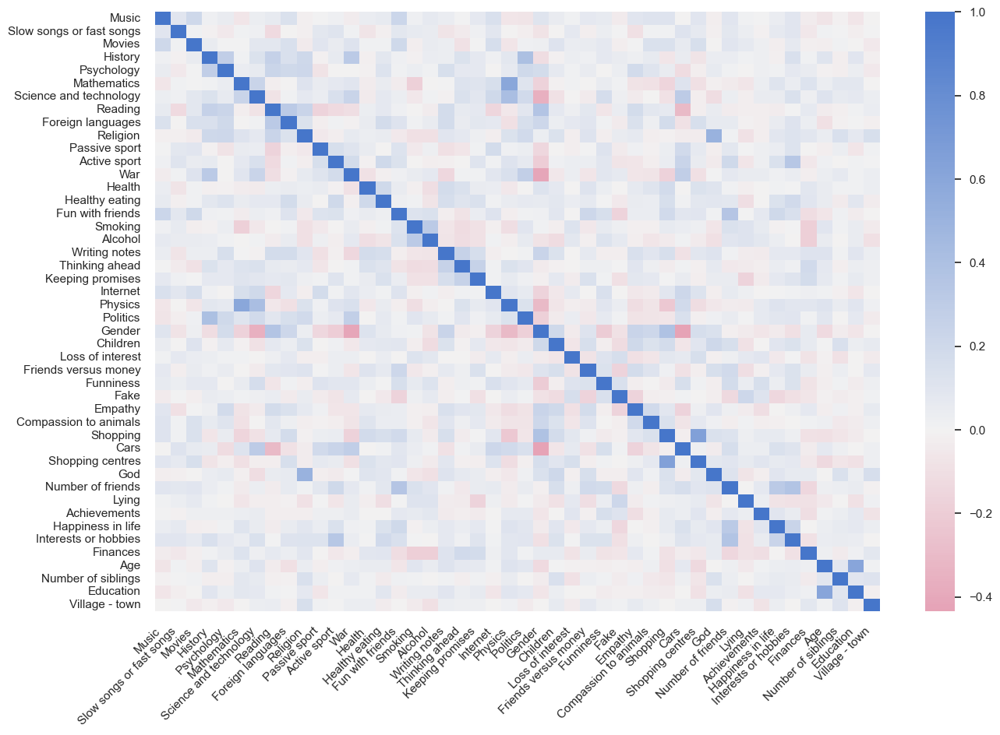

In [18]:
sns.set(rc={'figure.figsize':(15,10)})
ax=sns.heatmap(FilteredInterviewData.corr(), center=0.00, cmap=sns.diverging_palette(0, 255,as_cmap=True))
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

### The most correlated features

In [19]:
corr_matrix = FilteredInterviewData.corr()

# Sort the correlation matrix in descending order
sorted_corr_matrix = corr_matrix.abs().unstack().sort_values(ascending=False)

# Remove duplicates
sorted_corr_matrix = sorted_corr_matrix[sorted_corr_matrix.index.get_level_values(0) != sorted_corr_matrix.index.get_level_values(1)]

# Show the sorted list of correlations
sorted_corr_matrix.head(50)


Shopping                Shopping centres          0.650524
Shopping centres        Shopping                  0.650524
Education               Age                       0.610533
Age                     Education                 0.610533
Mathematics             Physics                   0.593086
Physics                 Mathematics               0.593086
Religion                God                       0.507092
God                     Religion                  0.507092
Cars                    Gender                    0.434919
Gender                  Cars                      0.434919
Physics                 Science and technology    0.419245
Science and technology  Physics                   0.419245
Gender                  War                       0.413348
War                     Gender                    0.413348
History                 Politics                  0.400856
Politics                History                   0.400856
Shopping                Gender                    0.3837

### List of 5 most correlated features for every feature

In [20]:
# Loop over each column in the correlation matrix
for col in corr_matrix.columns:
    print("Most correlated features with", col, ":")
    # Get the 5 most correlated features with the current column
    most_correlated = corr_matrix[col].sort_values(ascending=False).head(6).index[1:]
    print(list(most_correlated))
    print("--------------------------------------------------------------------------")

Most correlated features with Music :
['Fun with friends', 'Movies', 'Internet', 'Foreign languages', 'Shopping']
--------------------------------------------------------------------------
Most correlated features with Slow songs or fast songs :
['Cars', 'Active sport', 'Interests or hobbies', 'Music', 'Internet']
--------------------------------------------------------------------------
Most correlated features with Movies :
['Music', 'Fun with friends', 'Internet', 'Shopping centres', 'Foreign languages']
--------------------------------------------------------------------------
Most correlated features with History :
['Politics', 'War', 'Psychology', 'Reading', 'Religion']
--------------------------------------------------------------------------
Most correlated features with Psychology :
['History', 'Reading', 'Religion', 'Politics', 'Foreign languages']
--------------------------------------------------------------------------
Most correlated features with Mathematics :
['Physics'

### The top 15 features with strong correlation

In [21]:
# Get the sorted list of correlation between features
sorted_corr_matrix = corr_matrix.abs().unstack().sort_values(ascending=False)

# Remove duplicates
sorted_corr_matrix = sorted_corr_matrix[sorted_corr_matrix.index.get_level_values(0) != sorted_corr_matrix.index.get_level_values(1)]

# Get the 15 most correlated feature pairs
most_correlated_15 = sorted_corr_matrix.head(15)

# Get the combination of the 15 most correlated features
most_correlated_features = set()
for index, value in most_correlated_15.iteritems():
    feature1, feature2 = index
    most_correlated_features.add(feature1)
    most_correlated_features.add(feature2)

# Show the combination of the 15 most correlated features
print(most_correlated_features)

{'Gender', 'Education', 'Age', 'History', 'Politics', 'Physics', 'Shopping centres', 'Mathematics', 'God', 'Cars', 'Religion', 'Science and technology', 'Shopping', 'War'}


## Creating various datasets

In [22]:
FilteredInterviewDataCopy = FilteredInterviewData.copy()

In [62]:
PersonalityDF = FilteredInterviewDataCopy[['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education', 'Psychology', 'History']]

#PsychologicyDF = FilteredInterviewDataCopy[['God', 'Alcohol', 'Age', 'Education', 'Loneliness', 'Reading', 'Socializing', 'Mood swings']]

FavoritDF=FilteredInterviewDataCopy[['God', 'Alcohol', 'Age', 'Education', 'Finances', 'Reading', 'Movies', 'Music']]

ReligiousPersonalityDF = FilteredInterviewDataCopy[['God', 'Religion', 'Age', 'Education', 'History', 'Politics', 'Number of friends', 'Fun with friends']]

WarReligionScienceDF = FilteredInterviewDataCopy[['God', 'Religion', 'Science and technology', 'Education']]

AddictionHealthDF = FilteredInterviewDataCopy[['Science and technology', 'Alcohol', 'Smoking', 'Health', 'Healthy eating', 'Active sport']]

FriendsInterestsDF = FilteredInterviewDataCopy[['Fun with friends', 'Internet', 'Physics', 'Politics', 'Happiness in life']]

FinancesDF = FilteredInterviewDataCopy[['Finances', 'Children', 'Shopping', 'Shopping centres']]

listOfDFs = [PersonalityDF, ReligiousPersonalityDF, WarReligionScienceDF, AddictionHealthDF, FriendsInterestsDF, FinancesDF]



In [24]:
FilteredInterviewDataCopy = FilteredInterviewDataCopy.drop(columns=['Village - town', 'Gender'])

In [25]:
FilteredInterviewDataCopy.head()

,Music,Slow songs or fast songs,Movies,History,Psychology,Mathematics,Science and technology,Reading,Foreign languages,Religion,Passive sport,Active sport,War,Health,Healthy eating,Fun with friends,Smoking,Alcohol,Writing notes,Thinking ahead,Keeping promises,Internet,Physics,Politics,Children,Loss of interest,Friends versus money,Funniness,Fake,Empathy,Compassion to animals,Shopping,Cars,Shopping centres,God,Number of friends,Lying,Achievements,Happiness in life,Interests or hobbies,Finances,Age,Number of siblings,Education
0,5.0,3.0,5.0,1.0,5.0,3.0,4.0,3.0,5.0,1.0,1.0,5.0,1.0,1.0,4.0,5.0,0.0,5.0,5.0,2.0,4.0,5.0,3.0,1.0,5.0,1.0,3.0,5.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3,1.0,4.0,4.0,3.0,3.0,20.0,1.0,3.0
1,4.0,4.0,5.0,1.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,1.0,1.0,4.0,3.0,4.0,0.0,5.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,3.0,4.0,3.0,2.0,2.0,4.0,3.0,2.0,4.0,1.0,3,3.0,2.0,4.0,3.0,3.0,19.0,2.0,3.0
2,5.0,5.0,5.0,1.0,2.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0,2.0,3.0,5.0,3.0,5.0,5.0,5.0,5.0,4.0,2.0,1.0,4.0,1.0,5.0,2.0,4.0,5.0,4.0,4.0,1.0,4.0,5.0,3,3.0,3.0,4.0,5.0,2.0,20.0,2.0,2.0
3,5.0,3.0,5.0,4.0,4.0,4.0,3.0,5.0,4.0,4.0,1.0,1.0,3.0,1.0,3.0,2.0,5.0,5.0,4.0,3.0,4.0,3.0,1.0,5.0,2.0,5.0,2.0,1.0,1.0,3.0,2.0,4.0,1.0,4.0,4.0,1,4.0,3.0,2.0,4.0,2.0,22.0,1.0,3.0
4,5.0,3.0,5.0,3.0,2.0,2.0,3.0,5.0,3.0,4.0,3.0,1.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,5.0,4.0,2.0,2.0,3.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,5.0,3,5.0,3.0,3.0,3.0,4.0,20.0,1.0,2.0


## Visualization of data

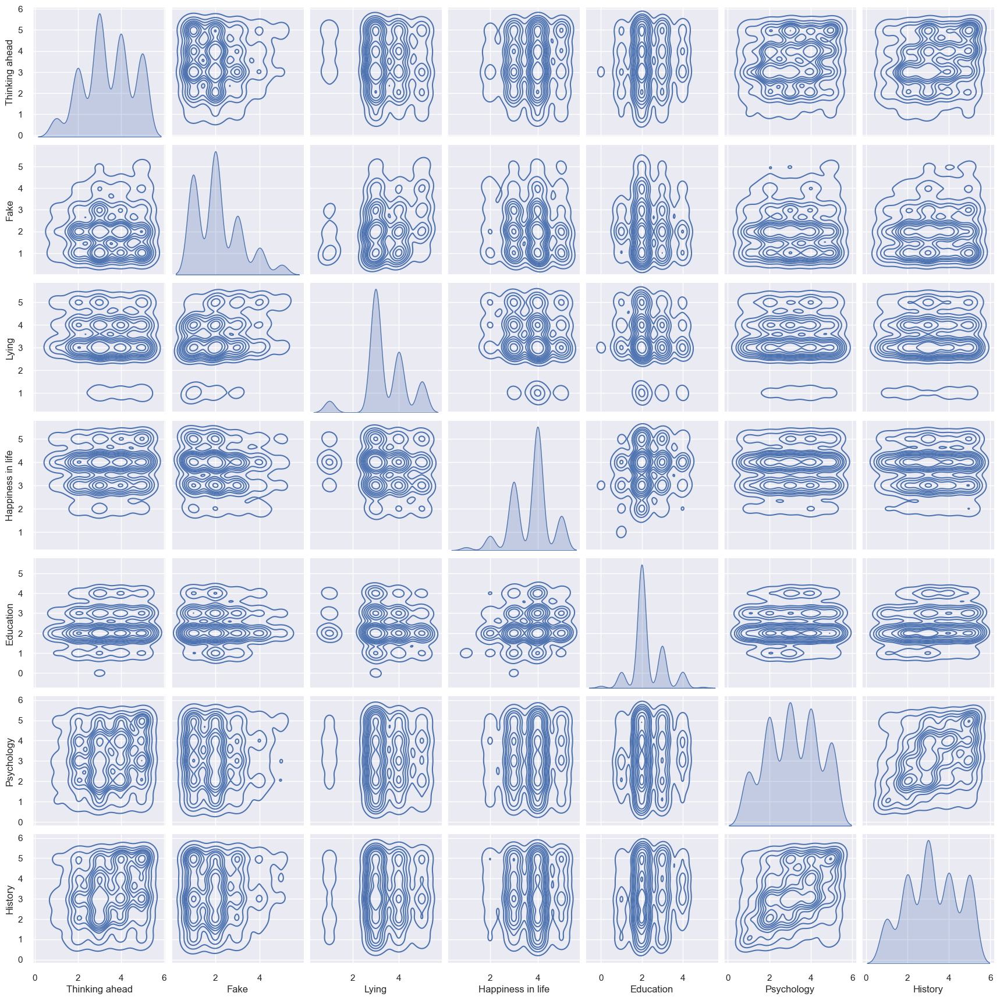

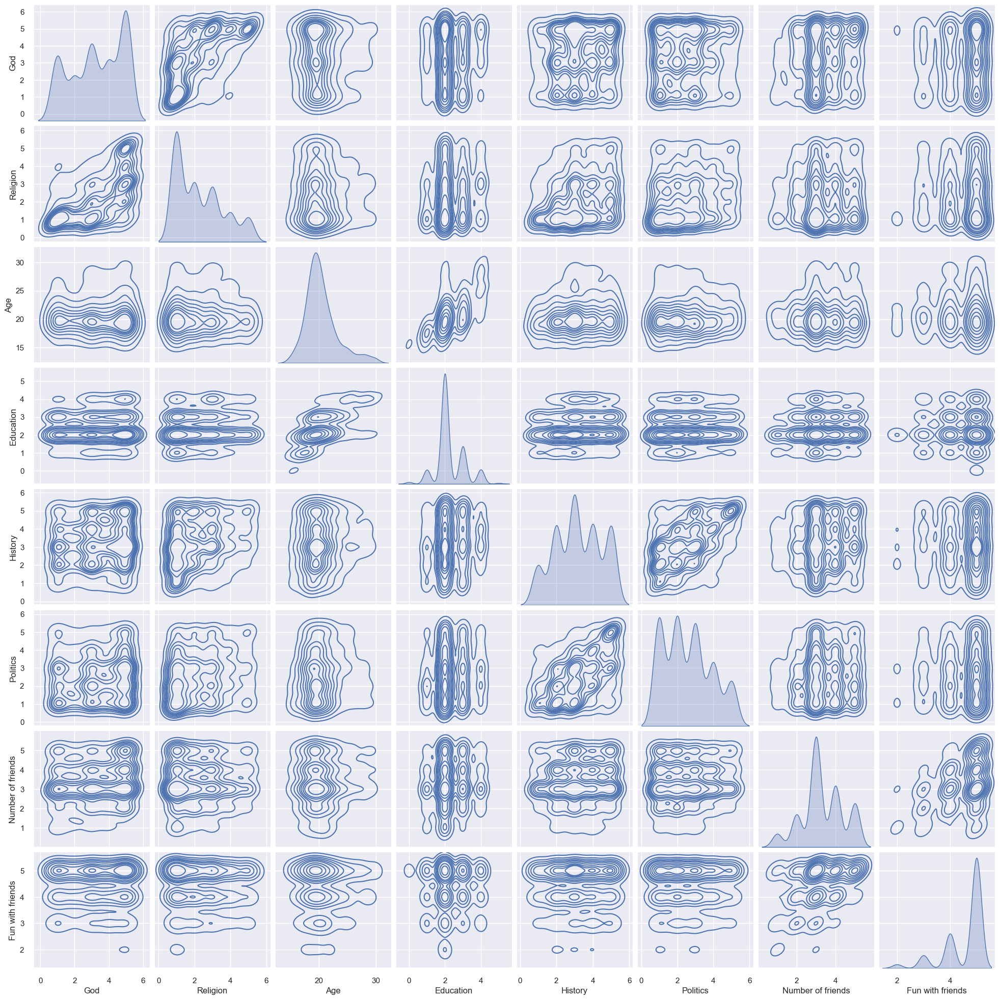

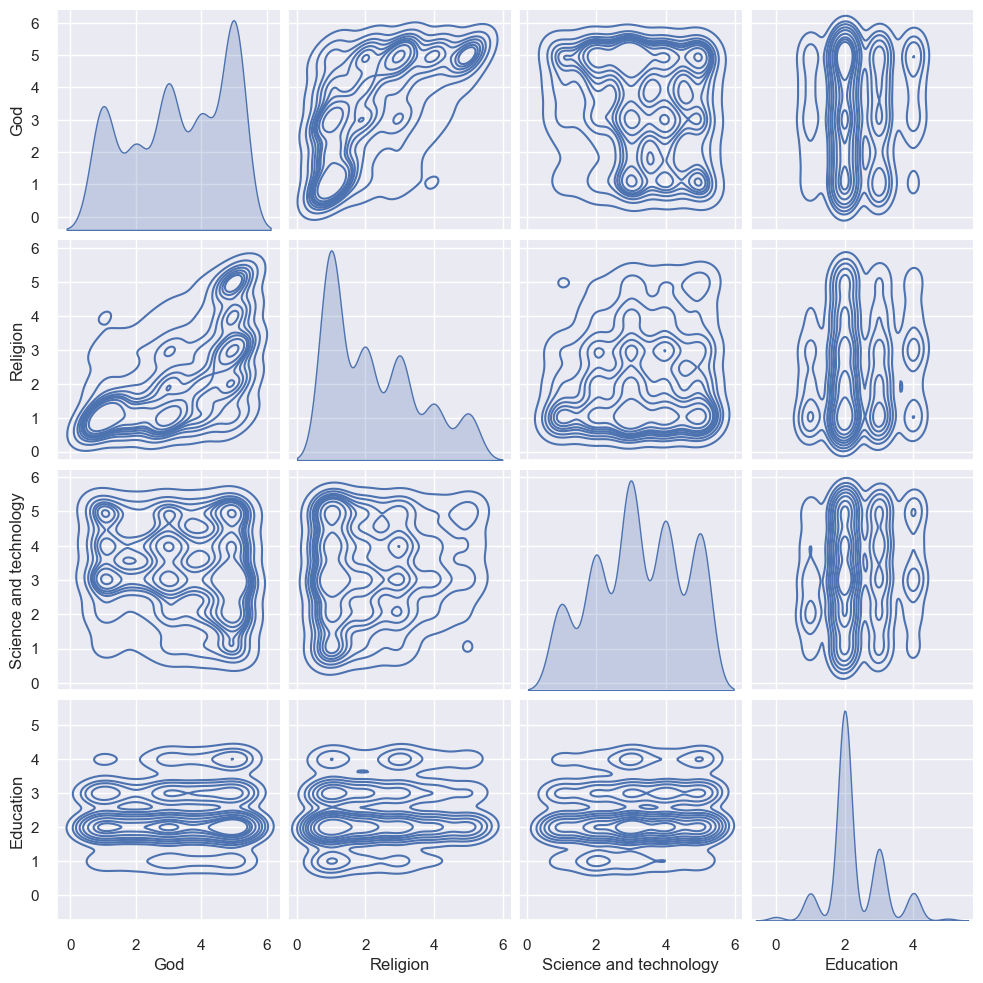

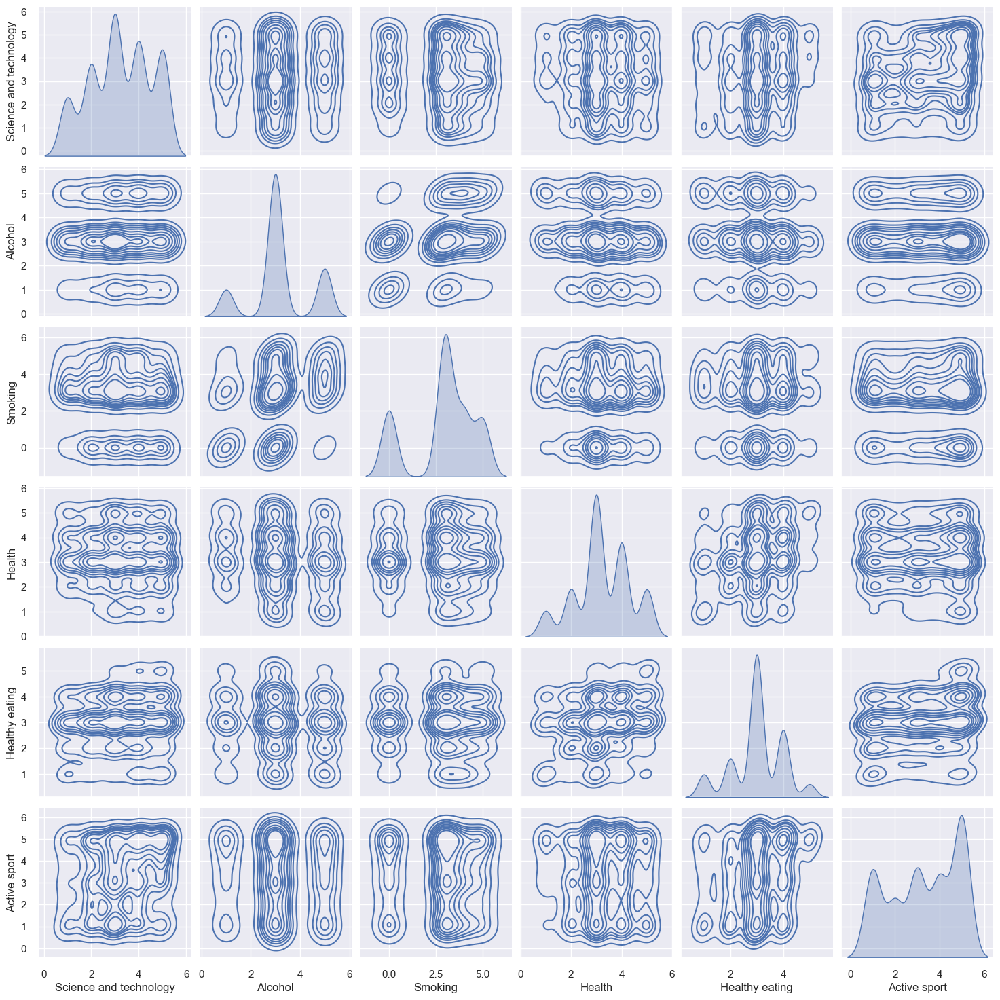

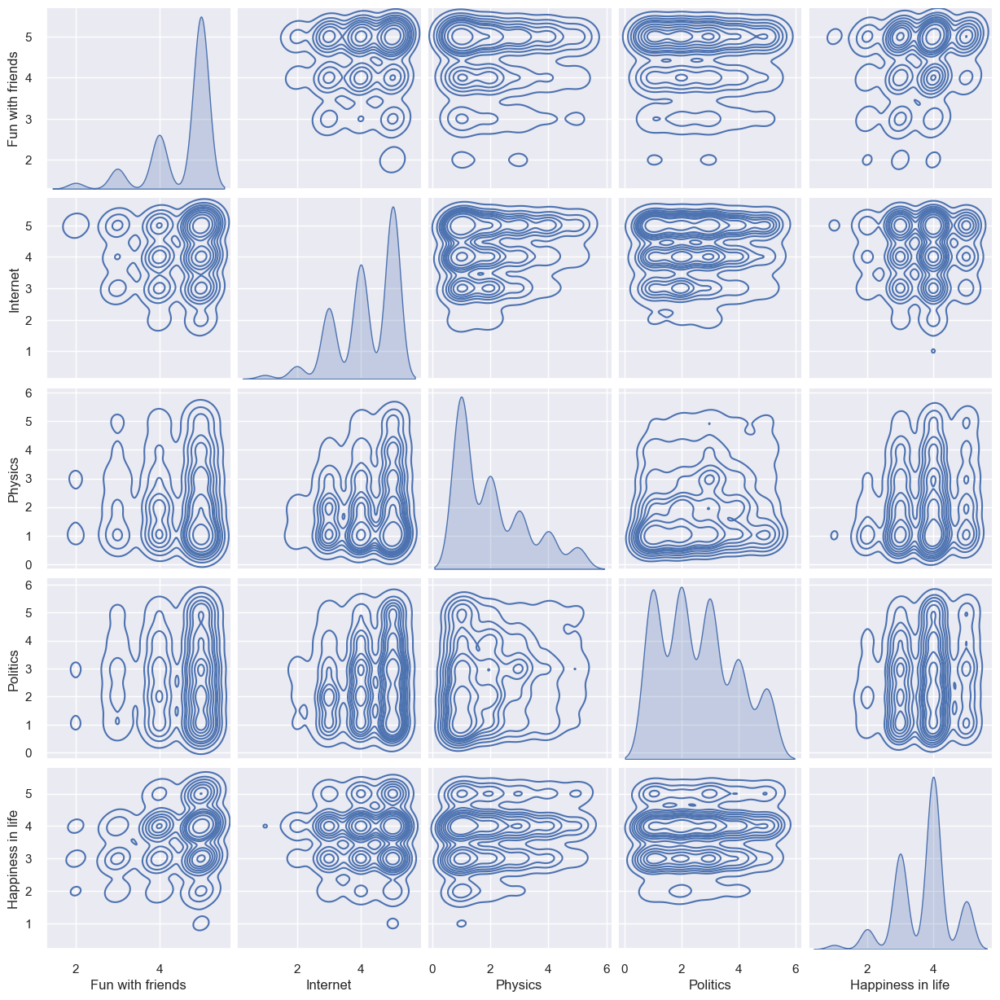

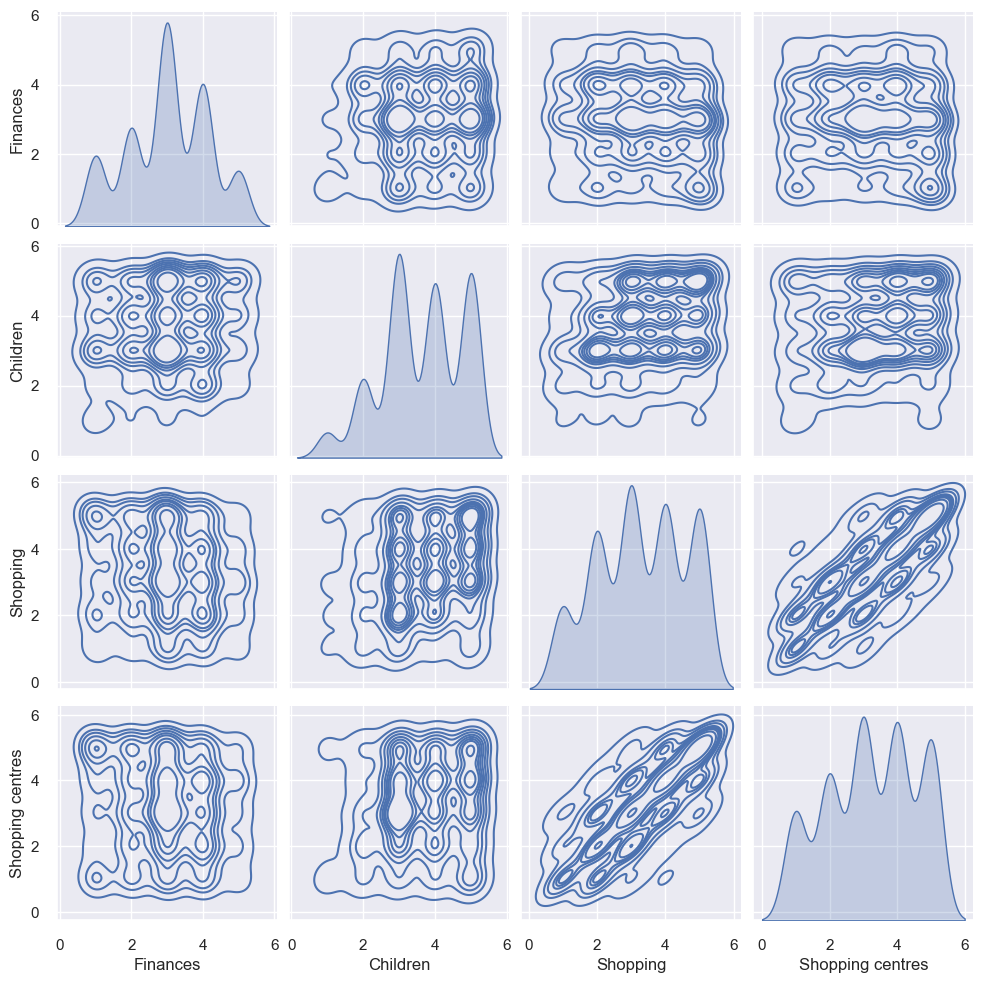

In [26]:
for df in listOfDFs:
    sns.pairplot(df, kind="kde")


### Favorite datastream vizualizing

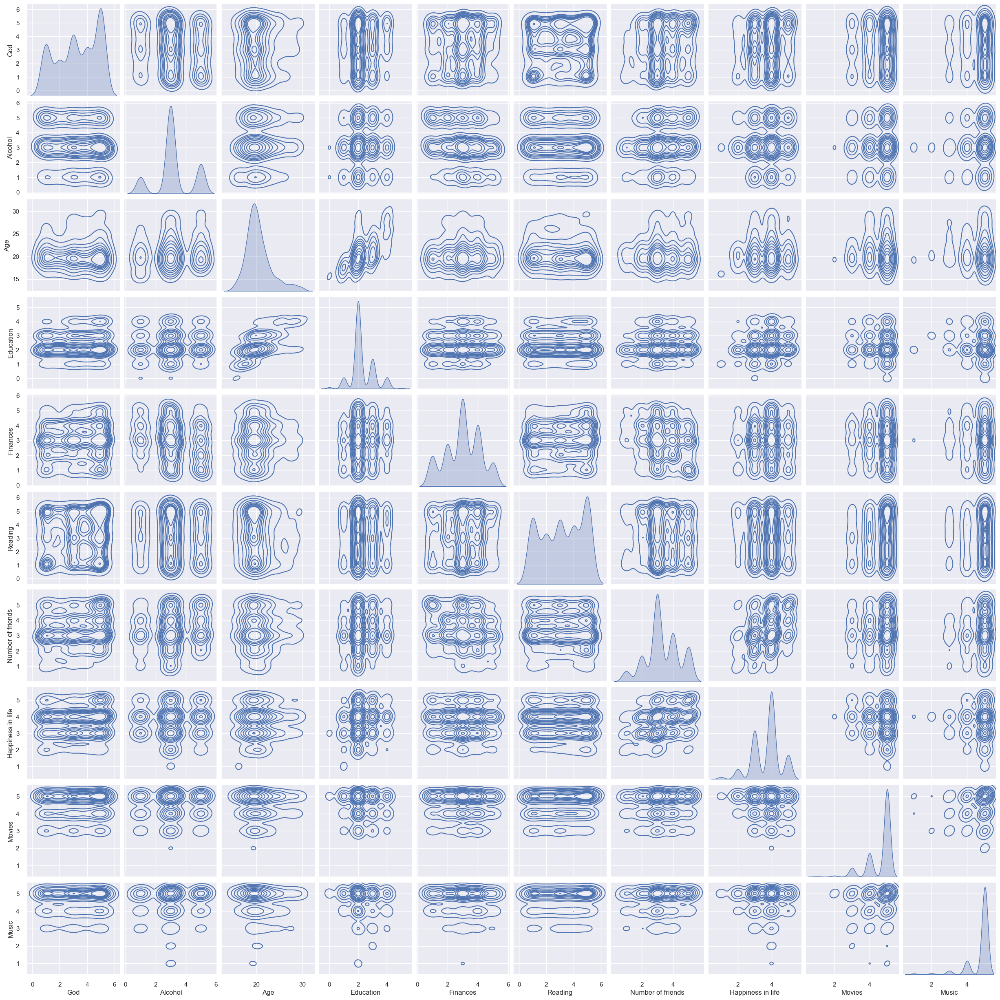

In [58]:
sns.pairplot(FavoritDF, kind="kde")

C:\Users\Nikola Petrovic\AppData\Local\Temp\ipykernel_23532\3630484265.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x = FilteredInterviewDataCopy['Finances'], y=FilteredInterviewDataCopy['Alcohol'], palette="GnBu_d");


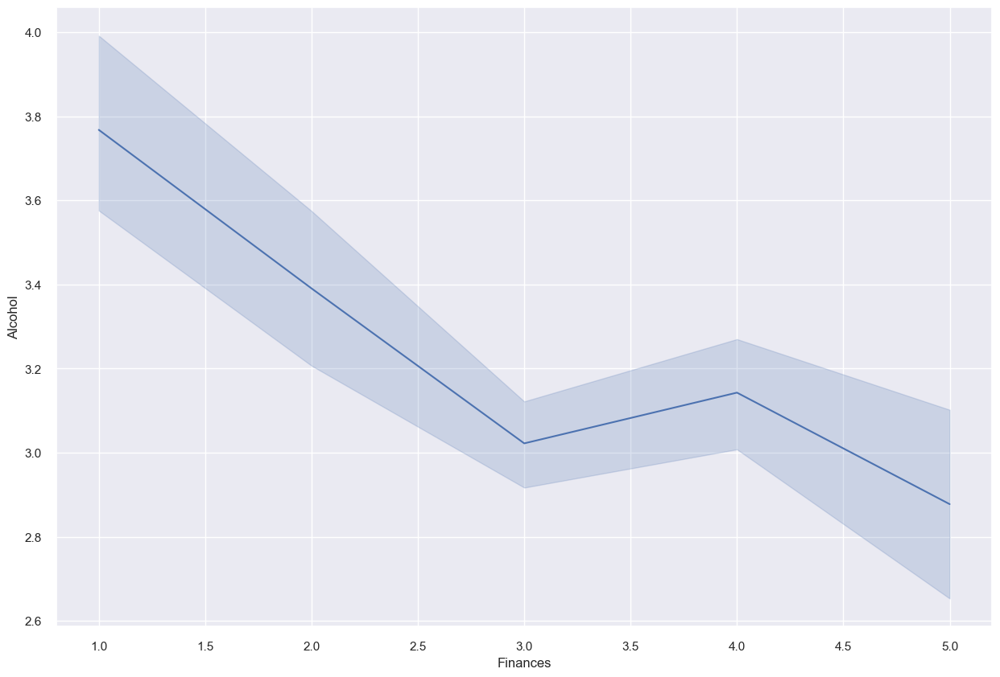

In [27]:
sns.lineplot(x = FilteredInterviewDataCopy['Finances'], y=FilteredInterviewDataCopy['Alcohol'], palette="GnBu_d");


In [142]:
FilteredInterviewDataCopy.head()

,Music,Slow songs or fast songs,Movies,History,Psychology,Mathematics,Science and technology,Reading,Foreign languages,Religion,Passive sport,Active sport,War,Health,Healthy eating,Fun with friends,Smoking,Alcohol,Writing notes,Thinking ahead,Keeping promises,Internet,Physics,Politics,Children,Loss of interest,Friends versus money,Funniness,Fake,Empathy,Compassion to animals,Shopping,Cars,Shopping centres,God,Number of friends,Lying,Achievements,Happiness in life,Interests or hobbies,Finances,Age,Number of siblings,Education
0,5.0,3.0,5.0,1.0,5.0,3.0,4.0,3.0,5.0,1.0,1.0,5.0,1.0,1.0,4.0,5.0,0.0,5.0,5.0,2.0,4.0,5.0,3.0,1.0,5.0,1.0,3.0,5.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3,1.0,4.0,4.0,3.0,3.0,20.0,1.0,3.0
1,4.0,4.0,5.0,1.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,1.0,1.0,4.0,3.0,4.0,0.0,5.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,3.0,4.0,3.0,2.0,2.0,4.0,3.0,2.0,4.0,1.0,3,3.0,2.0,4.0,3.0,3.0,19.0,2.0,3.0
2,5.0,5.0,5.0,1.0,2.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0,2.0,3.0,5.0,3.0,5.0,5.0,5.0,5.0,4.0,2.0,1.0,4.0,1.0,5.0,2.0,4.0,5.0,4.0,4.0,1.0,4.0,5.0,3,3.0,3.0,4.0,5.0,2.0,20.0,2.0,2.0
3,5.0,3.0,5.0,4.0,4.0,4.0,3.0,5.0,4.0,4.0,1.0,1.0,3.0,1.0,3.0,2.0,5.0,5.0,4.0,3.0,4.0,3.0,1.0,5.0,2.0,5.0,2.0,1.0,1.0,3.0,2.0,4.0,1.0,4.0,4.0,1,4.0,3.0,2.0,4.0,2.0,22.0,1.0,3.0
4,5.0,3.0,5.0,3.0,2.0,2.0,3.0,5.0,3.0,4.0,3.0,1.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,5.0,4.0,2.0,2.0,3.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,5.0,3,5.0,3.0,3.0,3.0,4.0,20.0,1.0,2.0


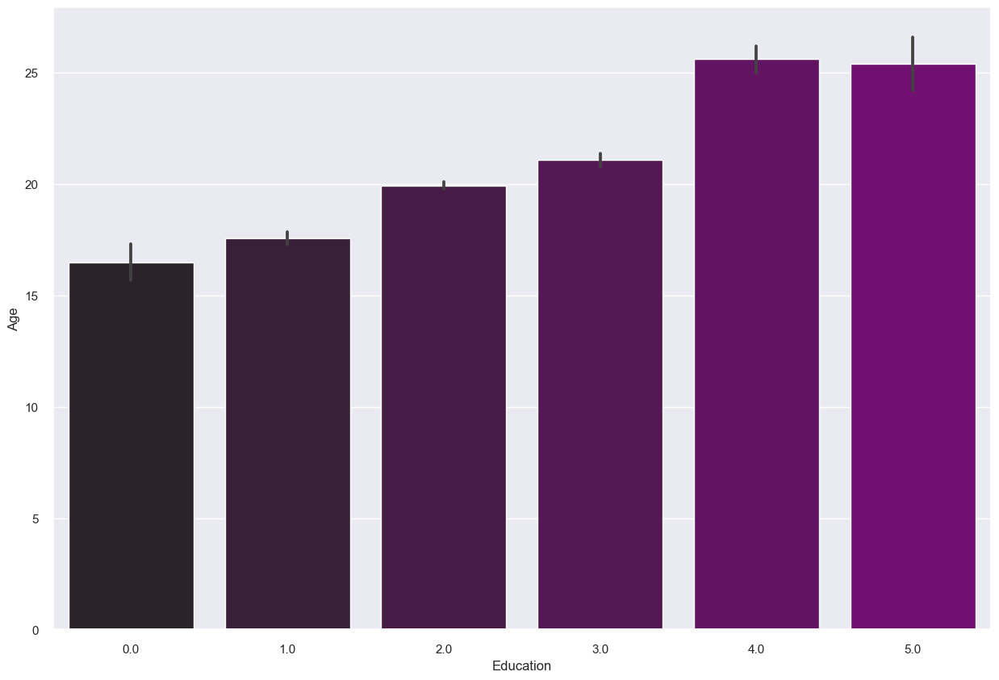

In [143]:
sns.barplot(x=FilteredInterviewDataCopy['Education'], y=FilteredInterviewDataCopy['Age'], palette=sns.dark_palette("purple"));


C:\Users\Nikola Petrovic\AppData\Local\Temp\ipykernel_23532\2626703314.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x=FilteredInterviewDataCopy['Education'], y=FilteredInterviewDataCopy['Age'], palette=sns.dark_palette("purple"));


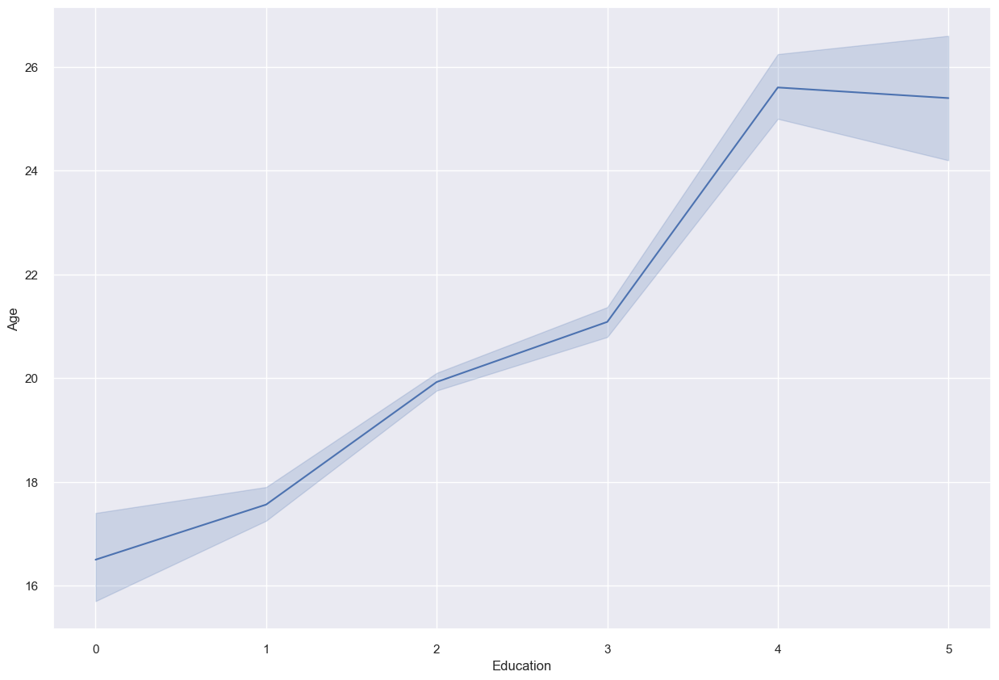

In [29]:
sns.lineplot(x=FilteredInterviewDataCopy['Education'], y=FilteredInterviewDataCopy['Age'], palette=sns.dark_palette("purple"));

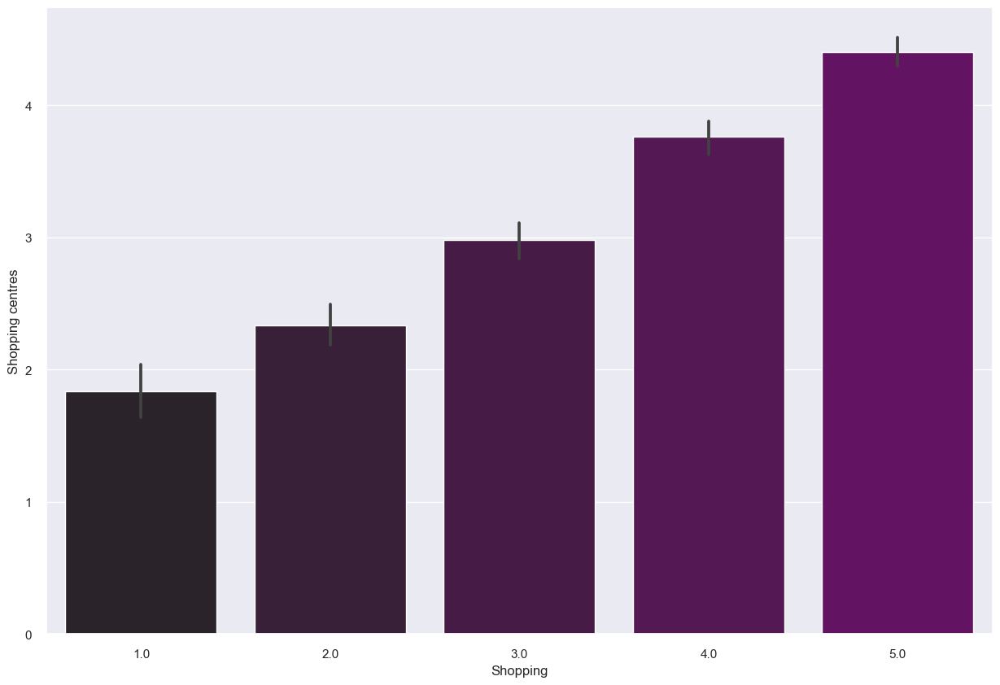

In [30]:
sns.barplot(x=FilteredInterviewDataCopy['Shopping'], y=FilteredInterviewDataCopy['Shopping centres'], palette=sns.dark_palette("purple"));

C:\Users\Nikola Petrovic\AppData\Local\Temp\ipykernel_23532\560021008.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(x=FilteredInterviewDataCopy['Shopping'], y=FilteredInterviewDataCopy['Shopping centres'], palette=sns.dark_palette("purple"));


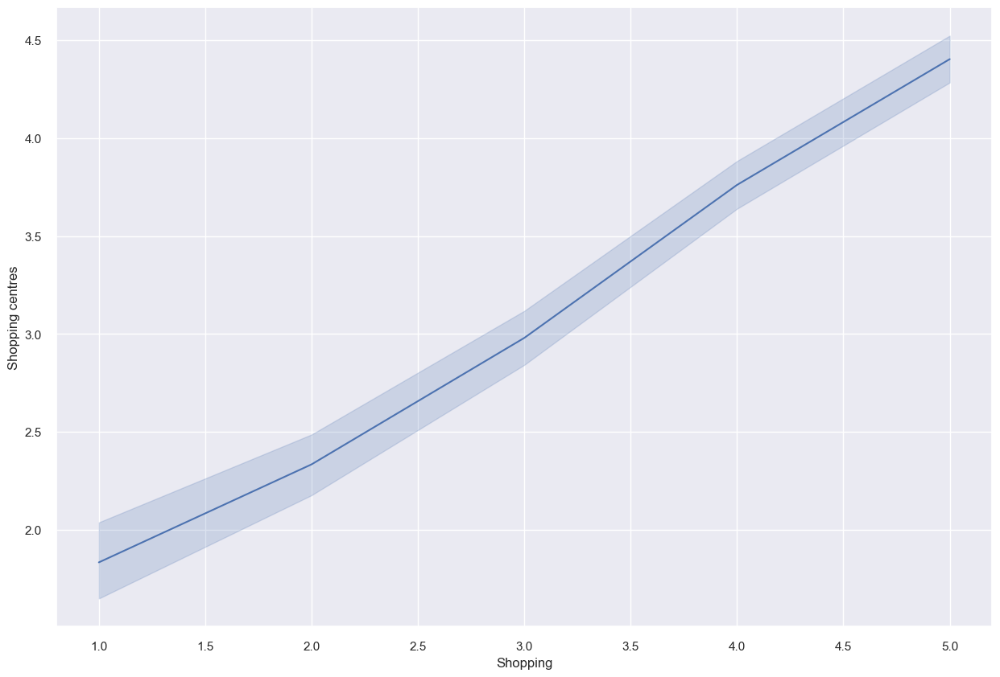

In [31]:
sns.lineplot(x=FilteredInterviewDataCopy['Shopping'], y=FilteredInterviewDataCopy['Shopping centres'], palette=sns.dark_palette("purple"));

## Clustering

### Helper functions

#### printClusters3DWithKMeans

In [32]:
# 3d scatterplot using plotly
def printClusters3DWithKMeans(DF):

    wcss = []
    for i in range(2, 9):
        km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 3000, n_init = 10,random_state=0)
        km.fit(DF)
        y_clusters = km.fit_predict(DF)
        wcss.append(km.inertia_)
    
    
    Scene = dict(xaxis = dict(title  = DF.columns[0]),yaxis = dict(title  = DF.columns[1]),zaxis = dict(title  = DF.columns[2]))
    # model.labels_ is nothing but the predicted clusters i.e y_clusters
    labels = km.labels_
    trace = go.Scatter3d(x=DF[DF.columns[0]], y=DF[DF.columns[1]], z=DF[DF.columns[2]], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
    layout = go.Layout(margin=dict(l=0,r=0), scene = Scene, height = 800, width = 800)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()

#### printClusters

In [33]:
def printClusters(dataset_, labels_, indices_=[0, 1, 2]):
    plt.figure(figsize = (12, 12))
    ax = plt.axes(projection='3d')
    for cluster in set(labels_):
        cluster_mask = [elem == cluster for elem in labels_]
        
        zdata = dataset_.iloc[cluster_mask, indices_[0]]
        xdata = dataset_.iloc[cluster_mask, indices_[1]]
        ydata = dataset_.iloc[cluster_mask, indices_[2]]
        ax.scatter3D(xdata, ydata, zdata)
        
        ax.set_xlabel(dataset_.columns[indices_[0]])
        ax.set_ylabel(dataset_.columns[indices_[1]])
        ax.set_zlabel(dataset_.columns[indices_[2]])

### Iterative algorithm for finding the best combinations of three features - FindBestFeaturesUsingKMeansAnd3DPlot

In [34]:
def FindBestFeaturesUsingKMeansAnd3DPlot(Dataset):
    df = Dataset
    kmeans_kwargs = {"init": "random", "n_init": 20,
                    "max_iter": 1000, "random_state": 1984}
    cut_off = 0.5
    maxvars = 3
    kmin = 4
    kmax = 6

    cols = list(df.columns)
    results_for_each_k = []
    vars_for_each_k = {}

    for k in range(kmin, kmax+1):
        selected_variables = []
        while(len(selected_variables) < maxvars):
            results = []
            for col in cols:
                scols = []
                scols.extend(selected_variables)
                scols.append(col)
                kmeans = KMeans(n_clusters = k, init = 'k-means++', max_iter = 3000, n_init = 10,random_state=0)
                with ignore_warnings(category=ConvergenceWarning):
                    kmeans.fit(df[scols])
                results.append(silhouette_score(df[scols], kmeans.predict(df[scols])))
            selected_var = cols[np.argmax(results)]

            selected_variables.append(selected_var)
            cols.remove(selected_var)

        cols = list(df.columns)
        results_for_each_k.append(max(results))
        vars_for_each_k[k] = selected_variables

    print("Results for each k")
    print(results_for_each_k)
    print(vars_for_each_k)

    best_k = np.argmax(results_for_each_k)+kmin
    #you can also force a value for k
    #best_k=3
    selected_variables = vars_for_each_k[best_k]
    kmeans = KMeans(n_clusters=best_k, **kmeans_kwargs)
    kmeans.fit(df[selected_variables])
    clusters = kmeans.predict(df[selected_variables])

    fig = px.scatter_3d(df, x=df[selected_variables[0]], y=df[selected_variables[1]],
                        z=df[selected_variables[2]], color=clusters, symbol=clusters, height=700)
    fig.show()

### Iterative selection of best features for all created datasets

In [146]:
for DF in listOfDFs:
    print(DF.columns)
    FindBestFeaturesUsingKMeansAnd3DPlot(DF)

Index(['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education',
       'Psychology', 'History'],
      dtype='object')
Results for each k
[0.35446210319162874, 0.3510428479176265, 0.35332697974392796]
{4: ['Lying', 'Education', 'Happiness in life'], 5: ['Thinking ahead', 'Education', 'Fake'], 6: ['Thinking ahead', 'Education', 'Happiness in life']}


Index(['God', 'Religion', 'Age', 'Education', 'History', 'Politics',
       'Number of friends', 'Fun with friends'],
      dtype='object')
Results for each k
[0.4074269391501988, 0.3986049077604784, 0.41706585138566055]
{4: ['Fun with friends', 'Education', 'Number of friends'], 5: ['God', 'Fun with friends', 'Religion'], 6: ['God', 'Fun with friends', 'Religion']}


Index(['God', 'Religion', 'Science and technology', 'Education'], dtype='object')
Results for each k
[0.39787971153739365, 0.37808969857167535, 0.3924753193690715]
{4: ['Education', 'Religion', 'God'], 5: ['God', 'Education', 'Religion'], 6: ['God', 'Education', 'Religion']}


Index(['Science and technology', 'Alcohol', 'Smoking', 'Health',
       'Healthy eating', 'Active sport'],
      dtype='object')
Results for each k
[0.41851780075831185, 0.3960809986984093, 0.3969019524979441]
{4: ['Alcohol', 'Smoking', 'Healthy eating'], 5: ['Science and technology', 'Alcohol', 'Smoking'], 6: ['Science and technology', 'Alcohol', 'Smoking']}


Index(['Fun with friends', 'Internet', 'Physics', 'Politics',
       'Happiness in life'],
      dtype='object')
Results for each k
[0.40971537704316696, 0.40377098027528235, 0.4366346395335483]
{4: ['Fun with friends', 'Internet', 'Physics'], 5: ['Fun with friends', 'Happiness in life', 'Internet'], 6: ['Fun with friends', 'Internet', 'Happiness in life']}


Index(['Finances', 'Children', 'Shopping', 'Shopping centres'], dtype='object')
Results for each k
[0.3183083827699893, 0.28072321922134147, 0.29171150677078816]
{4: ['Children', 'Shopping', 'Shopping centres'], 5: ['Finances', 'Children', 'Shopping centres'], 6: ['Finances', 'Children', 'Shopping']}


### Finding three best correlated features using Kmeans evaluating Silhouette score in whole selected dataset

In [36]:
# scaler = StandardScaler()
# df = scaler.fit_transform(FinancesDF)
df = FilteredInterviewDataCopy
kmeans_kwargs = {"init": "random", "n_init": 20,
                 "max_iter": 1000, "random_state": 1984}
cut_off = 0.5
maxvars = 3
kmin = 4
kmax = 6

cols = list(df.columns)
results_for_each_k = []
vars_for_each_k = {}

for k in range(kmin, kmax+1):
    selected_variables = []
    while(len(selected_variables) < maxvars):
        results = []
        for col in cols:
            scols = []
            scols.extend(selected_variables)
            scols.append(col)
            kmeans = KMeans(n_clusters = k, init = 'k-means++', max_iter = 3000, n_init = 10,random_state=0)
            with ignore_warnings(category=ConvergenceWarning):
                kmeans.fit(df[scols])
            results.append(silhouette_score(df[scols], kmeans.predict(df[scols])))
        selected_var = cols[np.argmax(results)]

        selected_variables.append(selected_var)
        cols.remove(selected_var)

    cols = list(df.columns)
    results_for_each_k.append(max(results))
    vars_for_each_k[k] = selected_variables

print("Results for each k")
print(results_for_each_k)
print(vars_for_each_k)

best_k = np.argmax(results_for_each_k)+kmin
#you can also force a value for k
#best_k=3
selected_variables = vars_for_each_k[best_k]
kmeans = KMeans(n_clusters=best_k, **kmeans_kwargs)
kmeans.fit(df[selected_variables])
clusters = kmeans.predict(df[selected_variables])

# %matplotlib inline

# fig = plt.figure(figsize=(15, 15))
# #plt.rcParams['font.size'] = 22
# ax = plt.axes(projection="3d")
# z_points = df[selected_variables[0]]
# x_points = df[selected_variables[1]]
# y_points = df[selected_variables[2]]
# f1 = ax.scatter3D(x_points, y_points, z_points,
#                   c=clusters, cmap='Accent', s=300)

# ax.set_xlabel(selected_variables[0], fontsize=20)
# ax.set_ylabel(selected_variables[1], fontsize=20)
# ax.set_zlabel(selected_variables[2], fontsize=20)
# ax.legend(clusters)

# plt.title('KMeans used on the Europe Datasets', fontsize=24)
# plt.show()

# Scene = dict(xaxis = dict(title  = DF.columns[0]),yaxis = dict(title  = DF.columns[1]),zaxis = dict(title  = DF.columns[2]))
# # model.labels_ is nothing but the predicted clusters i.e y_clusters
# labels = km.labels_
# trace = go.Scatter3d(x=DF[DF.columns[0]], y=DF[DF.columns[1]], z=DF[DF.columns[2]], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
# layout = go.Layout(margin=dict(l=0,r=0), scene = Scene, height = 800, width = 800)
# data = [trace]
# fig = go.Figure(data = data, layout = layout)
# fig.show()


Results for each k
[0.649697688260963, 0.6947411701173352, 0.712696672827937]
{4: ['Fun with friends', 'Alcohol', 'Music'], 5: ['Music', 'Alcohol', 'Movies'], 6: ['Music', 'Alcohol', 'Movies']}


In [147]:
fig = px.scatter_3d(df, x=df[selected_variables[0]], y=df[selected_variables[1]],
                    z=df[selected_variables[2]], color=clusters, symbol=clusters, height=700)
fig.show()


### Finding three best atributes using favorite dataaset

In [148]:
print(PersonalityDF.columns)
FindBestFeaturesUsingKMeansAnd3DPlot(PersonalityDF)

Index(['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education',
       'Psychology', 'History'],
      dtype='object')
Results for each k
[0.35446210319162874, 0.3510428479176265, 0.35332697974392796]
{4: ['Lying', 'Education', 'Happiness in life'], 5: ['Thinking ahead', 'Education', 'Fake'], 6: ['Thinking ahead', 'Education', 'Happiness in life']}


### All of selected data K-means

In [38]:
FilteredInterviewDataCopy.head()

,Music,Slow songs or fast songs,Movies,History,Psychology,Mathematics,Science and technology,Reading,Foreign languages,Religion,Passive sport,Active sport,War,Health,Healthy eating,Fun with friends,Smoking,Alcohol,Writing notes,Thinking ahead,Keeping promises,Internet,Physics,Politics,Children,Loss of interest,Friends versus money,Funniness,Fake,Empathy,Compassion to animals,Shopping,Cars,Shopping centres,God,Number of friends,Lying,Achievements,Happiness in life,Interests or hobbies,Finances,Age,Number of siblings,Education
0,5.0,3.0,5.0,1.0,5.0,3.0,4.0,3.0,5.0,1.0,1.0,5.0,1.0,1.0,4.0,5.0,0.0,5.0,5.0,2.0,4.0,5.0,3.0,1.0,5.0,1.0,3.0,5.0,1.0,3.0,5.0,4.0,1.0,4.0,1.0,3,1.0,4.0,4.0,3.0,3.0,20.0,1.0,3.0
1,4.0,4.0,5.0,1.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,1.0,1.0,4.0,3.0,4.0,0.0,5.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,3.0,4.0,3.0,2.0,2.0,4.0,3.0,2.0,4.0,1.0,3,3.0,2.0,4.0,3.0,3.0,19.0,2.0,3.0
2,5.0,5.0,5.0,1.0,2.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0,2.0,3.0,5.0,3.0,5.0,5.0,5.0,5.0,4.0,2.0,1.0,4.0,1.0,5.0,2.0,4.0,5.0,4.0,4.0,1.0,4.0,5.0,3,3.0,3.0,4.0,5.0,2.0,20.0,2.0,2.0
3,5.0,3.0,5.0,4.0,4.0,4.0,3.0,5.0,4.0,4.0,1.0,1.0,3.0,1.0,3.0,2.0,5.0,5.0,4.0,3.0,4.0,3.0,1.0,5.0,2.0,5.0,2.0,1.0,1.0,3.0,2.0,4.0,1.0,4.0,4.0,1,4.0,3.0,2.0,4.0,2.0,22.0,1.0,3.0
4,5.0,3.0,5.0,3.0,2.0,2.0,3.0,5.0,3.0,4.0,3.0,1.0,3.0,3.0,4.0,4.0,3.0,3.0,2.0,5.0,4.0,2.0,2.0,3.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,5.0,3,5.0,3.0,3.0,3.0,4.0,20.0,1.0,2.0


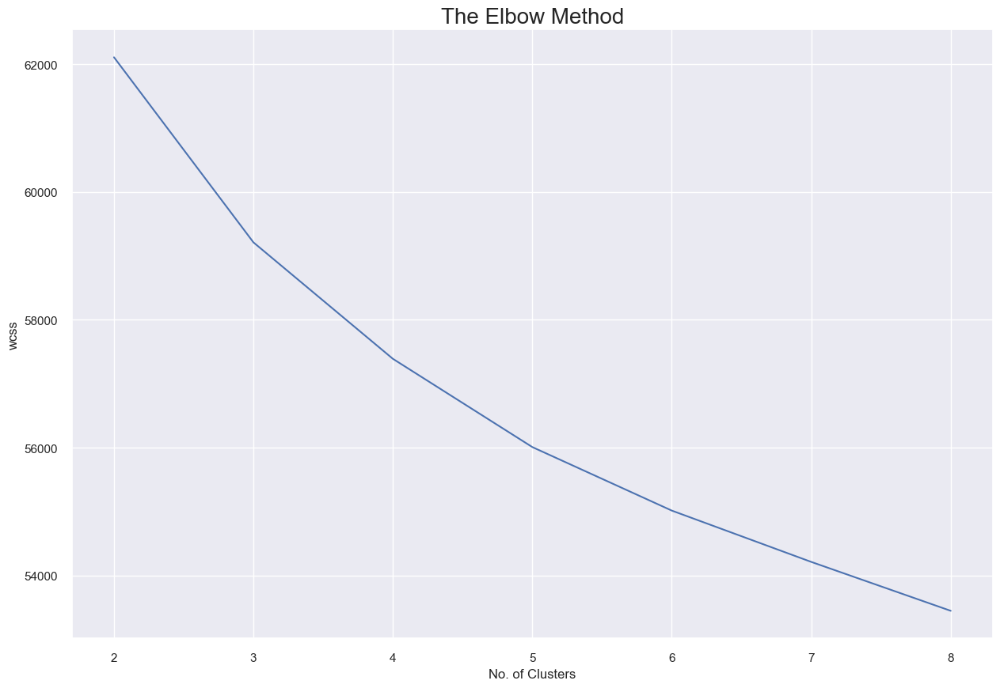

In [101]:
x=FilteredInterviewDataCopy
wcss = []
for i in range(2, 9):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 3000, n_init = 10,random_state=0)
    km.fit(x)
    y_clusters = km.fit_predict(x)
    wcss.append(km.inertia_)

plt.plot(range(2, 9), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

In [102]:
# znaci sutra radim sistem ili brisem sve pajtone zauvek ne mogu milion verzija istih programa vise
kl = KneeLocator( range(2, 9), wcss, curve="convex", direction="decreasing")
kl.elbow

4

#### Scores

In [103]:
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 3000, n_init = 30)
km.fit(x)
y_means=km.predict(x)

print("calinski_harabasz_score", calinski_harabasz_score(x, y_means))
print("Silhouette score: ", silhouette_score(x,y_means))
print("Davies-Bouldin score: ", davies_bouldin_score(x,y_means))

calinski_harabasz_score 59.832070805801614
Silhouette score:  0.05350407801295962
Davies-Bouldin score:  3.330998025414045


### Favorite dataset k-means 

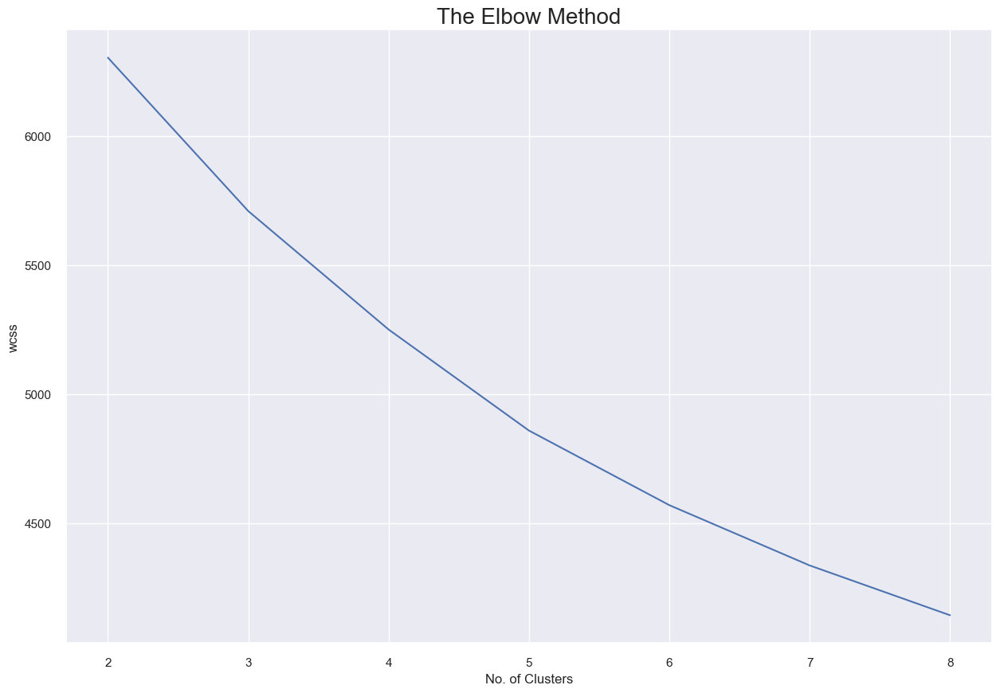

Best number for clusters:5


In [104]:
x=PersonalityDF
wcss = []
for i in range(2, 9):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 3000, n_init = 10,random_state=0)
    km.fit(x)
    y_clusters = km.fit_predict(x)
    wcss.append(km.inertia_)

plt.plot(range(2, 9), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

kl = KneeLocator( range(2, 9), wcss, curve="convex", direction="decreasing")
print("Best number for clusters:" +str(kl.elbow))

#### Scores for Personality Dataset

In [105]:
km = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 3000, n_init = 30)
km.fit(x)
y_means=km.predict(x)

print("calinski_harabasz_score", calinski_harabasz_score(x, y_means))
print("Silhouette score: ", silhouette_score(x,y_means))
print("Davies-Bouldin score: ", davies_bouldin_score(x,y_means))

calinski_harabasz_score 149.09875744488465
Silhouette score:  0.13999584561246325
Davies-Bouldin score:  1.7625625093022983


In [73]:
x.head()

,Thinking ahead,Fake,Lying,Happiness in life,Education,Psychology,History
0,2.0,1.0,1.0,4.0,3.0,5.0,1.0
1,4.0,2.0,3.0,4.0,3.0,3.0,1.0
2,5.0,4.0,3.0,4.0,2.0,2.0,1.0
3,3.0,1.0,4.0,2.0,3.0,4.0,4.0
4,5.0,2.0,5.0,3.0,2.0,2.0,3.0


<AxesSubplot: ylabel='count'>

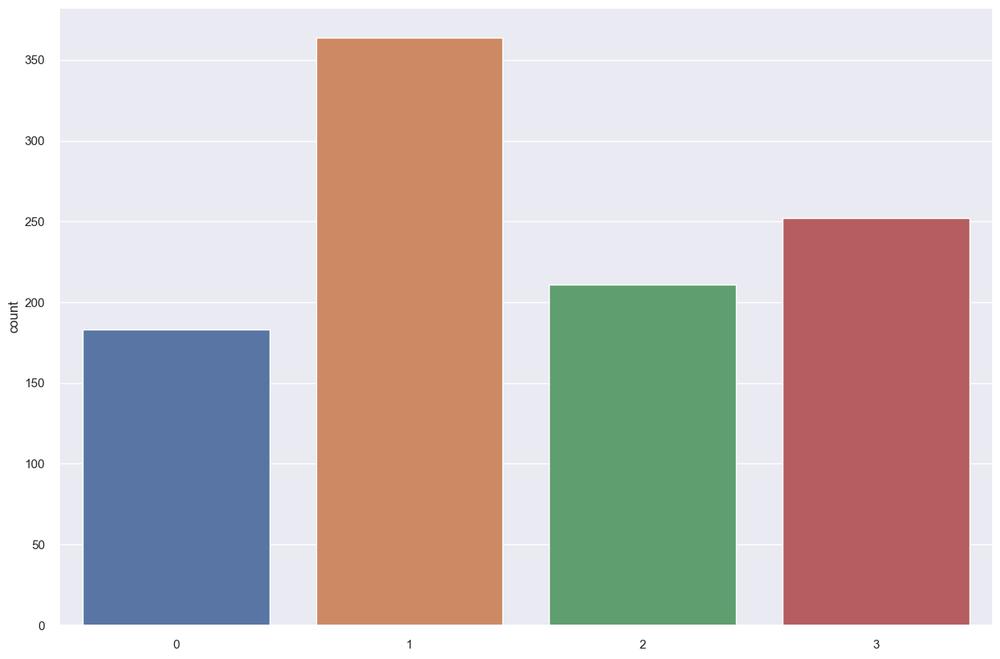

In [163]:
sns.countplot(x=y_means)

### Checking the best number of clusters

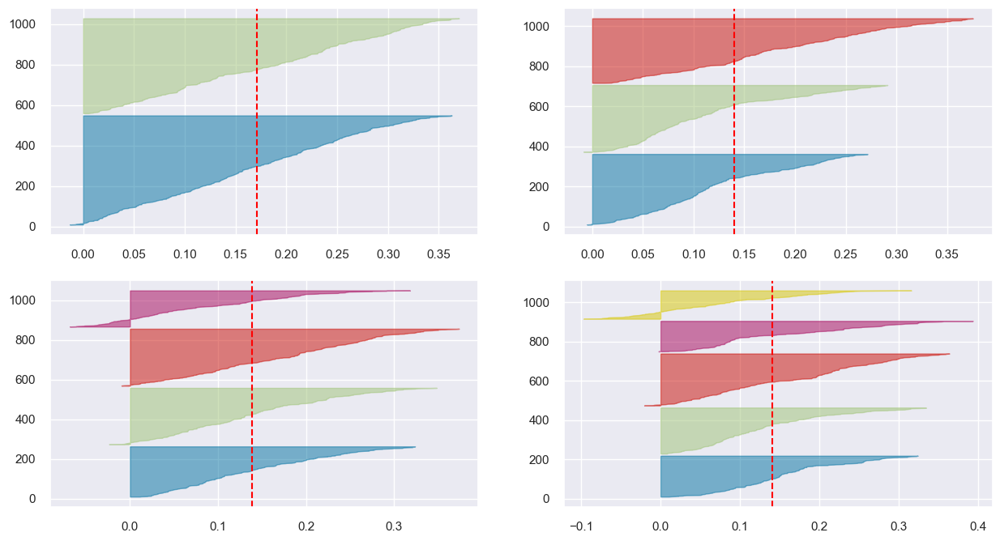

In [74]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(x)

## Hierarhical clustering

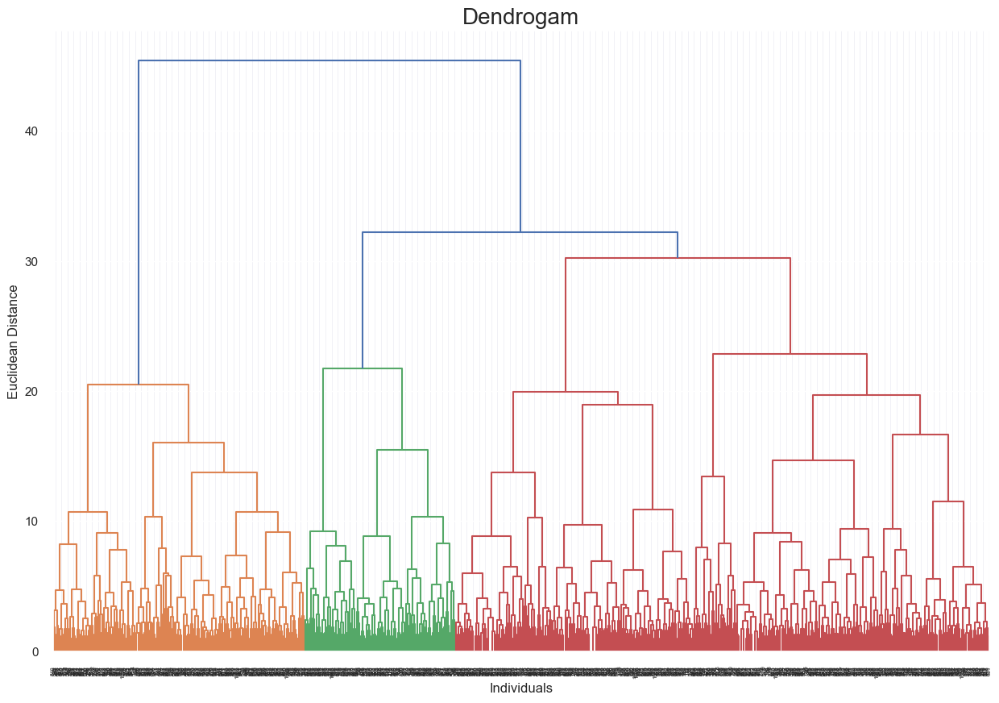

In [75]:
dendrogram = sch.dendrogram(sch.linkage(PersonalityDF, method = 'ward'))
plt.title('Dendrogam', fontsize = 20)
plt.xlabel('Individuals')
plt.ylabel('Euclidean Distance')
plt.show()

## Aglomerative Clustering

In [141]:

best_score = 0.0
best_ac_labels = None

for k in range(3, 8):
    ac_model = AgglomerativeClustering(n_clusters=k, compute_distances=True)
    ac_labels = ac_model.fit_predict(PersonalityDF)
    
    sil_score = silhouette_score(PersonalityDF, ac_labels)
    
    if (sil_score > best_score):
        best_score = sil_score
        best_ac_labels = ac_labels
    
    print("Clusters: ", k)
    print(ac_labels)
    print("calinski_harabasz_score", calinski_harabasz_score(PersonalityDF, ac_labels))
    print("Silhouette score: ", silhouette_score(PersonalityDF, ac_labels))
    print("Davies-Bouldin score: ", davies_bouldin_score(PersonalityDF, ac_labels))
    print("------------------------------------------")

Clusters:  3
[0 1 1 ... 0 0 1]
calinski_harabasz_score 126.17761047262229
Silhouette score:  0.0968574911400497
Davies-Bouldin score:  2.3253009779835896
------------------------------------------
Clusters:  4
[0 1 1 ... 0 3 1]
calinski_harabasz_score 117.49368001853938
Silhouette score:  0.09429884255245231
Davies-Bouldin score:  2.3144305171893422
------------------------------------------
Clusters:  5
[4 1 1 ... 2 3 1]
calinski_harabasz_score 104.27728911912206
Silhouette score:  0.09885993018468027
Davies-Bouldin score:  2.1231643435358247
------------------------------------------
Clusters:  6
[4 0 0 ... 2 1 0]
calinski_harabasz_score 96.15685473495306
Silhouette score:  0.0981230917772904
Davies-Bouldin score:  1.9946354403792095
------------------------------------------
Clusters:  7
[4 6 6 ... 2 0 6]
calinski_harabasz_score 90.39248868554292
Silhouette score:  0.08318684599121791
Davies-Bouldin score:  2.045049479251787
------------------------------------------


## Gaussian Mixture Model

In [84]:
from sklearn import mixture
def GaussianMixModel(inputDF):

    best_score = 0.0
    best_gm_labels = None

    for k in range(4, 7):
        gm_model =  mixture.GaussianMixture(n_components=k, covariance_type='spherical').fit(inputDF)
        gm_labels = gm_model.fit_predict(inputDF)

        sil_score = silhouette_score(inputDF, gm_labels)
        
        if (sil_score > best_score):
            best_score = sil_score
            best_gm_labels = gm_labels
        
        print("n clusters: ", k)
        print(gm_labels)
        print("calinski_harabasz_score", calinski_harabasz_score(inputDF, gm_labels))
        print("Silhouette score: ", sil_score)
        print("Davies-Bouldin score: ", davies_bouldin_score(inputDF, gm_labels))
        print("------------------------------------------")

    #printClusters(FinancesDF, best_gm_labels, [0,3,2])
    fig = px.scatter_3d(inputDF, x=inputDF.columns[2], y=inputDF.columns[3], z=inputDF.columns[4], color=best_gm_labels, symbol=best_gm_labels, height=700)
    fig.show() 

In [145]:
print(PersonalityDF.columns)
GaussianMixModel(PersonalityDF)

Index(['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education',
       'Psychology', 'History'],
      dtype='object')
n clusters:  4
[0 2 2 ... 2 0 3]
Silhouette score:  0.131189206337497
Davies-Bouldin score:  1.9297601954802213
------------------------------------------
n clusters:  5
[2 4 4 ... 1 2 4]
Silhouette score:  0.10264396114513194
Davies-Bouldin score:  1.8841920993949035
------------------------------------------
n clusters:  6
[5 1 1 ... 1 5 0]
Silhouette score:  0.11546114238810214
Davies-Bouldin score:  1.8013640971469702
------------------------------------------


## PCA

In [138]:
def printClusters3DUsingPCA(DF):
    pca = PCA(n_components=3)
    PCA_components = pca.fit_transform(DF)
    principalComponents = pd.DataFrame(PCA_components, columns=(["f1","f2", "f3"]))
    principalComponents.head()

    best_score = 0.0
    best_gm_pca_labels = None

    for k in range(4,7):
        gm_pca_model =  mixture.GaussianMixture(n_components=k, covariance_type='spherical').fit(DF)
        gm_pca_labels = gm_pca_model.fit_predict(principalComponents)

        sil_score = silhouette_score(principalComponents, gm_pca_labels)
        
        if (sil_score > best_score):
            best_score = sil_score
            best_gm_pca_labels = gm_pca_labels
            
        print("n clusters: ", k)
        print(gm_pca_labels)
        print("calinski_harabasz_score", calinski_harabasz_score(principalComponents, gm_pca_labels))
        print("Silhouette score: ", sil_score)
        print("Davies-Bouldin score: ", davies_bouldin_score(principalComponents, gm_pca_labels))
        print("------------------------------------------")
        
    principalComponents.head()

    fig = plt.figure()
    ax = plt.axes(projection='3d')

    ax.scatter3D(principalComponents["f1"], principalComponents["f2"], principalComponents["f3"], c=gm_pca_labels, cmap='Reds')
    ax.set_title("3D scatterplot of size-reduced data")

    plt.show()

    

    #fig = px.scatter_3d(DF, x=DF['Lying'], y=DF['Happiness in life'], z=DF['Fake'], color=best_gm_pca_labels, symbol=best_gm_pca_labels, height=700)
    #fig.show() 

Index(['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education',
       'Psychology', 'History'],
      dtype='object')
n clusters:  4
[0 2 2 ... 2 0 2]
calinski_harabasz_score 356.23707594177375
Silhouette score:  0.24364271123847878
Davies-Bouldin score:  1.1462301690302303
------------------------------------------
n clusters:  5
[0 4 4 ... 4 0 3]
calinski_harabasz_score 350.72413902623146
Silhouette score:  0.2335895209273987
Davies-Bouldin score:  1.1449623623447134
------------------------------------------
n clusters:  6
[0 2 2 ... 2 1 5]
calinski_harabasz_score 326.6836148151577
Silhouette score:  0.21864831360494325
Davies-Bouldin score:  1.2155611068371786
------------------------------------------


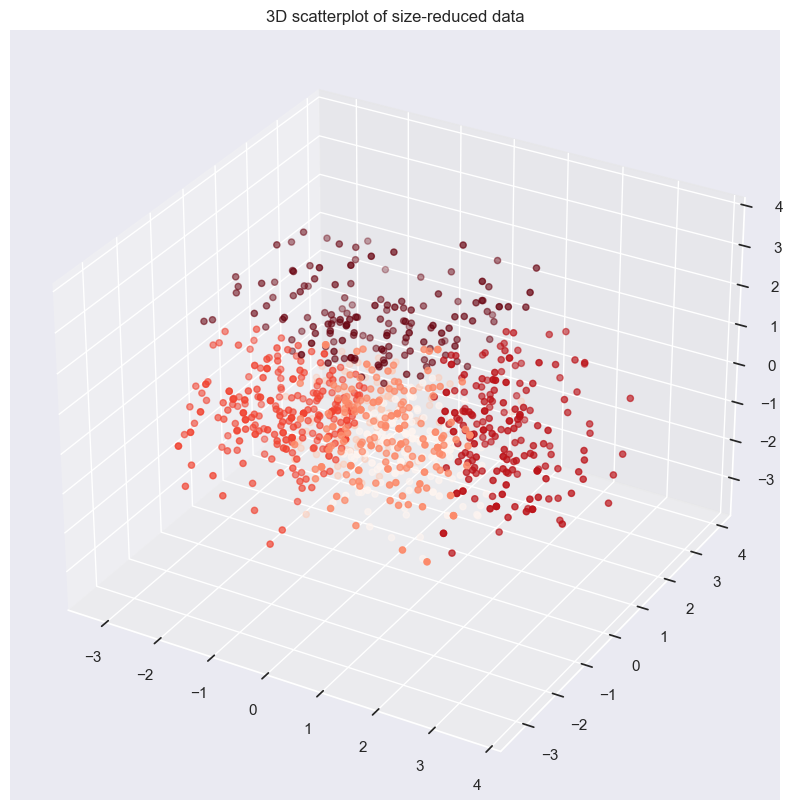

In [140]:
print(PersonalityDF.columns)
printClusters3DUsingPCA(PersonalityDF)

### Zakljucak

In [160]:
print(PersonalityDF.columns)
FindBestFeaturesUsingKMeansAnd3DPlot(PersonalityDF)


Index(['Thinking ahead', 'Fake', 'Lying', 'Happiness in life', 'Education',
       'Psychology', 'History'],
      dtype='object')
Results for each k
[0.35446210319162874, 0.3510428479176265, 0.35332697974392796]
{4: ['Lying', 'Education', 'Happiness in life'], 5: ['Thinking ahead', 'Education', 'Fake'], 6: ['Thinking ahead', 'Education', 'Happiness in life']}


In [25]:
def AglomerativeClustering(x):
    #scaler=StandardScaler()
    #scaler.fit(x)
    wcss = []
    #x=scaler.transform(x)
    for i in range(2, 8):
        hc = AgglomerativeClustering(n_clusters = i, affinity = 'euclidean')
        y_hc = hc.fit_predict(x)
        s=silhouette_score(x,y_hc)
        wcss.append(s)
    plt.plot(range(2, 8), wcss)
    plt.title('No. of clusters vs Silhouette Score', fontsize = 20)
    plt.xlabel('No. of Clusters')
    plt.ylabel('Silhouette_Score')
    plt.show()

### Evaluating Clustering Performance Using Advanced Techniques

In [111]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
features, true_labels = make_moons(n_samples=250, noise=0.05, random_state=42)
scaled_features = scaler.fit_transform(features)
kmeans = KMeans(n_clusters=5)
dbscan = DBSCAN(eps=0.3)
# Fit the algorithms to the features
kmeans.fit(scaled_features)
dbscan.fit(scaled_features)

# Compute the silhouette scores for each algorithm
kmeans_silhouette = silhouette_score(scaled_features, kmeans.labels_).round(2)
dbscan_silhouette = silhouette_score(scaled_features, dbscan.labels_).round (2)

print("Kmeans sillhouette: "+str(kmeans_silhouette))
print("Dbscan silhouette: "+str(dbscan_silhouette))

ari_kmeans = adjusted_rand_score(true_labels, kmeans.labels_)
ari_dbscan = adjusted_rand_score(true_labels, dbscan.labels_)
print("ARI statistika kmeans: " +str(round(ari_kmeans, 2)))
print("Ari statistika dbscan: "+str(round(ari_dbscan, 2)))# Unlike the silhouette coefficient,
# the ARI uses true cluster assignments to measure the similarity between true and predicted labels.

c:\Users\Nikola Petrovic\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\Nikola Petrovic\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



Kmeans sillhouette: 0.47
Dbscan silhouette: 0.38
ARI statistika kmeans: 0.3
Ari statistika dbscan: 1.0


## What kind of person are you?

In [112]:
person = FilteredInterviewDataCopy[['Religion', 'Fun with friends', 'Science and technology']]

In [ ]:
Science=input("Input your science score 1-5: ")
Religion=input("Input your religion score 1-5: ")
FWF=input("Input your fun with friends score 1-5: ")

In [ ]:
Religion=input("Input your religion score 1-5: ")

In [ ]:
FWF=input("Input your fun with friends score 1-5: ")

In [113]:
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 1000, n_init = 30,random_state=2)
x=person
km.fit(x)
y_means=km.predict(x)
cent = km.cluster_centers_
person['y_means']=y_means
person.groupby('y_means').mean()
kmeans=pd.DataFrame(y_means)

C:\Users\Nikola Petrovic\AppData\Local\Temp\ipykernel_23532\3919961197.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [153]:
person.head(15)

,Religion,Fun with friends,Science and technology,y_means
0,1.0,5.0,4.0,3
1,1.0,4.0,3.0,1
2,5.0,5.0,2.0,2
3,4.0,2.0,3.0,2
4,4.0,4.0,3.0,2
5,2.0,3.0,3.0,1
6,1.0,5.0,4.0,3
7,2.0,4.0,2.0,1
8,2.0,4.0,1.0,1
9,4.0,5.0,3.0,2


### Little fun 

In [164]:
#Science=input("Input your science score 1-5: ")
#Religion=input("Input your religion score 1-5: ")
#FWF=input("Input your fun with friends score 1-5: ")
def function(Science, Religion, FWF):
      global pom
      test=[[Science, Religion, FWF]]
      y_means=km.predict(test)
      print("Group: "+str(y_means[0]))
      if y_means[0]==1:
            pom="You are identified to be a good person but a little confused!"
            #print("You are identified to be a good person but a little confused!")
      elif y_means[0]==3:
            pom="You are identified to be a likeable person but manipulative and not heartfelt!"
            #print("You are identified to be a likeable person but manipulative and not heartfelt!")
      elif y_means[0]==0:
            pom="You are identified to be an valuable person and student!"
            #print("You are identified to be an valuable person and student!")
      elif y_means[0]==2:
            pom="You are identified to be a atheist but smart!"
            #print("You are identified to be a atheist but smart!")
      else:
            pom="You are identified to be an outcast!"
            #print("You are identified to be an outcast!")
#function(Science, Religion, FWF)
#print(pom)


def on_submit():
    if not all(var.get() for var in vars):
        messagebox.showerror("Error", "Not all radio buttons are selected!")
    else:
        Science = science_var.get()
        Religion = religion_var.get()
        FWF = fwf_var.get()
        function(Science, Religion, FWF)
        result_label.config(text=pom)
        if first_name_entry.get() and last_name_entry.get():
            save_to_csv(first_name_entry.get(), last_name_entry.get(), Science, Religion, FWF, pom)

def save_to_csv(first_name, last_name, science, religion, fwf, result):
    with open('results.csv', mode='a') as csv_file:
        fieldnames = ['First Name', 'Last Name', 'Science', 'Religion', 'FWF', 'Result']
        writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
        writer.writerow({'First Name': first_name, 'Last Name': last_name, 'Science': science, 'Religion': religion, 'FWF': fwf, 'Result': result})

root = tk.Tk()
root.title("User Input")
root.geometry("500x500")

first_name_label = tk.Label(root, text="First Name: ")
first_name_label.grid(row=0, column=0, sticky="W", pady=10)

first_name_entry = tk.Entry(root)
first_name_entry.grid(row=0, column=1)

last_name_label = tk.Label(root, text="Last Name: ")
last_name_label.grid(row=1, column=0, sticky="W", pady=10)

last_name_entry = tk.Entry(root)
last_name_entry.grid(row=1, column=1)

science_label = tk.Label(root, text="Select Science: ")
science_label.grid(row=2, column=0, sticky="W", pady=10)

science_var = tk.IntVar()

for i in range(1, 6):
    tk.Radiobutton(root, variable=science_var, value=i).grid(row=3, column=i-1, padx=20)
root.grid_columnconfigure(2, minsize=40)

religion_label = tk.Label(root, text="Select Religion: ")
religion_label.grid(row=4, column=0, sticky="W", pady=10)

religion_var = tk.IntVar()

for i in range(1, 6):
    tk.Radiobutton(root, variable=religion_var, value=i).grid(row=5, column=i-1, padx=20)
root.grid_columnconfigure(2, minsize=40)

fwf_label = tk.Label(root, text="Select FWF: ")
fwf_label.grid(row=6, column=0, sticky="W", pady=10)

fwf_var = tk.IntVar()

for i in range(1, 6):
    tk.Radiobutton(root, variable=fwf_var, value=i).grid(row=7, column=i-1, padx=20)
root.grid_columnconfigure(2, minsize=40)

vars = [science_var, religion_var, fwf_var]

submit_button = tk.Button(root, text="Submit", bg="blue", command=on_submit)
submit_button.grid(row=8, column=2)

result_label = tk.Label(root, text="", font=("Arial", 14))
result_label.grid(row=9, column=0, columnspan=5, pady=10)
result_label.config(text="Results")
result_label.config(fg="blue", font=("Arial", 20, "bold"))
result_label.config(anchor="center")
result_label.config(width=20, height=4, wraplength=400)
root.grid_columnconfigure(0, weight=1)
root.grid_rowconfigure(9, weight=1)

close_button = tk.Button(root, text="Close", bg="red", command=root.destroy)
close_button.grid(row=10, column=2)

root.mainloop()


#Science=input("Input your science score 1-5: ")
#Religion=input("Input your religion score 1-5: ")
#FWF=input("Input your fun with friends score 1-5: ")


c:\Users\Nikola Petrovic\anaconda3\lib\site-packages\sklearn\base.py:409: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



Group: 1
